<a href="https://colab.research.google.com/github/giardinas-dev/awesome-pytorch-ml/blob/main/Riconoscimento_di_fiori_AgriTech_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

from timm import create_model
import torch.optim as optim

from torchsummary import summary
import matplotlib.pyplot as plt
import numpy as np
import os
import random


from sklearn.metrics import confusion_matrix, f1_score
import seaborn as sns
import json
from sklearn.model_selection import StratifiedShuffleSplit
from torch.utils.data import Subset


In [ ]:
# Random seed for reproducibility
seed = 22

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)

In [ ]:
import requests
import tarfile
import io
import os




url = 'https://proai-datasets.s3.eu-west-3.amazonaws.com/progetto-finale-flowes.tar.gz'
filename = 'dataset_flowers'


if not os.path.exists(filename):
    print("File ZIP non trovato. Scaricamento in corso...")
    response = requests.get(url)
    response.raise_for_status()
    with tarfile.open(fileobj=io.BytesIO(response.content), mode='r:gz') as tar:
       for member in tar.getmembers():
          print(member)
       tar.extractall(path=filename)

## Rimozione metadati
!find dataset_flowers/progetto-finale-flowes/train/dandelion -name "._*" -delete

!find dataset_flowers/progetto-finale-flowes/valid/dandelion -name "._*" -delete

!find dataset_flowers/progetto-finale-flowes/test/dandelion -name "._*" -delete

!find dataset_flowers/progetto-finale-flowes/train/daisy -name "._*" -delete

!find dataset_flowers/progetto-finale-flowes/valid/daisy -name "._*" -delete

!find dataset_flowers/progetto-finale-flowes/test/daisy -name "._*" -delete



File ZIP non trovato. Scaricamento in corso...
<TarInfo '._progetto-finale-flowes' at 0x7916f0d6ba00>
<TarInfo 'progetto-finale-flowes' at 0x7916f0d6ab00>
<TarInfo 'progetto-finale-flowes/._README.roboflow.txt' at 0x7916f0d6aa40>
<TarInfo 'progetto-finale-flowes/README.roboflow.txt' at 0x7916f0d6bc40>
<TarInfo 'progetto-finale-flowes/._valid' at 0x7916f0d6bac0>
<TarInfo 'progetto-finale-flowes/valid' at 0x7916f0d6bd00>
<TarInfo 'progetto-finale-flowes/._README.dataset.txt' at 0x7916f0d6bb80>
<TarInfo 'progetto-finale-flowes/README.dataset.txt' at 0x7916f0d6bdc0>
<TarInfo 'progetto-finale-flowes/._.DS_Store' at 0x7916f0d6be80>
<TarInfo 'progetto-finale-flowes/.DS_Store' at 0x7916f0c4c040>
<TarInfo 'progetto-finale-flowes/._test' at 0x7916f0d6bf40>
<TarInfo 'progetto-finale-flowes/test' at 0x7916f0c4c100>
<TarInfo 'progetto-finale-flowes/._train' at 0x7916f0c4c1c0>
<TarInfo 'progetto-finale-flowes/train' at 0x7916f0c4c340>
<TarInfo 'progetto-finale-flowes/train/._.DS_Store' at 0x7916f0c4

In [ ]:
def stratified_subset(dataset, ratio, seed=37):

    targets = dataset.targets
    sss = StratifiedShuffleSplit(n_splits=1, test_size=ratio, random_state=seed)
    indices = list(range(len(dataset)))
    for reduced_idx, _ in sss.split(indices, targets):
        break
    return Subset(dataset, reduced_idx)




**PREPROCESSING**

Per uniformare le immagini in input ai modelli, ogni immagine è stata ridimensionata a 256×256 pixel. Successivamente, le immagini sono state normalizzate con media e deviazione standard pari a (0.5, 0.5, 0.5), una scelta compatibile con modelli pre-addestrati su ImageNet, facilitando così il trasferimento di apprendimento e migliorando la convergenza durante il training.



**DATA AUGMENTATION**

Considerando la variabilità visiva naturale presente nel dataset di fiori, sono state implementate diverse strategie di data augmentation per aumentare la robustezza dei modelli. Sono state definite tre tipologie di trasformazioni con crescente complessità: light, medium e deep. La trasformazione light prevede un semplice flip orizzontale casuale e variazioni di luminosità e contrasto per simulare condizioni di illuminazione variabili. La trasformazione media introduce anche flip verticali, piccole rotazioni, traslazioni, e scale, assieme a cambiamenti di tonalità, saturazione e lievi effetti di blur e rumore. Infine, la trasformazione profonda aggiunge ulteriori distorsioni geometriche (come elastiche e ottiche), rumore, e variazioni più aggressive di colore, al fine di modellare una maggiore varietà di condizioni visive e migliorare la capacità di generalizzazione su immagini reali più complesse.









In [ ]:


import torchvision.transforms as T

transform_simple = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
    T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

transform_light = T.Compose([
    T.Resize((256, 256)),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.3, contrast=0.3),
    T.ToTensor(),
    T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

transform_medium = T.Compose([
    T.Resize((256, 256)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomAffine(degrees=10, translate=(0.04, 0.04), scale=(0.95, 1.05), fill=0),
    T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.1, hue=0.03),
    T.GaussianBlur(kernel_size=(1, 1), sigma=(0.1, 2.0)),
    T.ToTensor(),
    T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

transform_deep = T.Compose([
    T.Resize((256, 256)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomAffine(degrees=10, translate=(0.04, 0.04), scale=(0.95, 1.05), fill=0),
    T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.2, hue=0.06),
    T.ToTensor(),
    T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])


batch_size = 32


transforms_dict = {
    "light": transform_light,
    "medium": transform_medium,
    "deep": transform_deep,
}

trainloaders = []
trainsets = []
classes = []
for level, _level_transform in transforms_dict.items():
    print(f"Datatrain with {level} augmentation")

    # Carica dataset con la trasformazione scelta
    trainset = torchvision.datasets.ImageFolder(root='dataset_flowers/progetto-finale-flowes/train', transform=_level_transform)

    classes = trainset.classes

    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)


    trainloaders.append(trainloader)

    trainsets.append(trainset)


valset = torchvision.datasets.ImageFolder(root='dataset_flowers/progetto-finale-flowes/valid', transform=transform_simple)
testset = torchvision.datasets.ImageFolder(root='dataset_flowers/progetto-finale-flowes/test',transform=transform_simple)
valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)



Datatrain with light augmentation
Datatrain with medium augmentation
Datatrain with deep augmentation


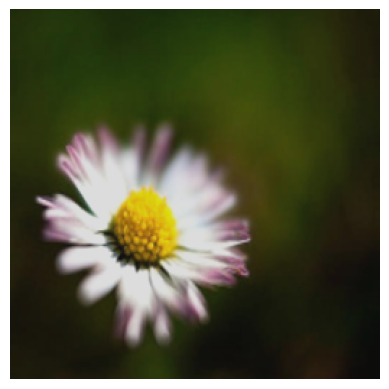

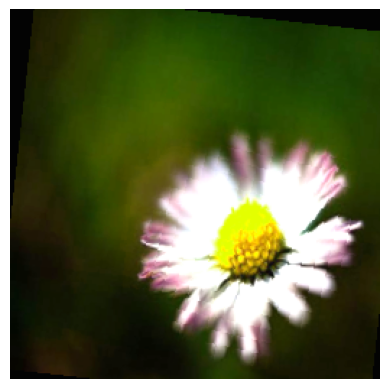

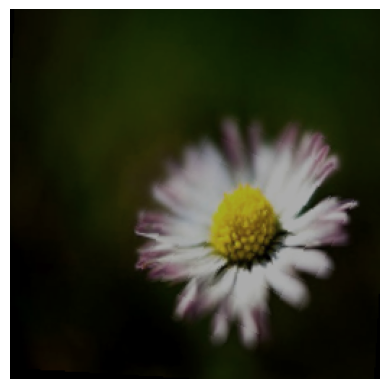

In [ ]:
def tensor_to_image(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    return np.transpose(npimg, (1, 2, 0))



# Mostra l'immagine numero 98 dal dataset con trasformazioni "light"
plt.imshow(tensor_to_image(trainsets[0][96][0]))
plt.axis('off')  # nasconde assi e griglie
plt.show()

# Mostra l'immagine numero 98 dal dataset con trasformazioni "medium"
plt.imshow(tensor_to_image(trainsets[1][96][0]))
plt.axis('off')
plt.show()

# Mostra l'immagine numero 98 dal dataset con trasformazioni "deep"
plt.imshow(tensor_to_image(trainsets[2][96][0]))
plt.axis('off')
plt.show()

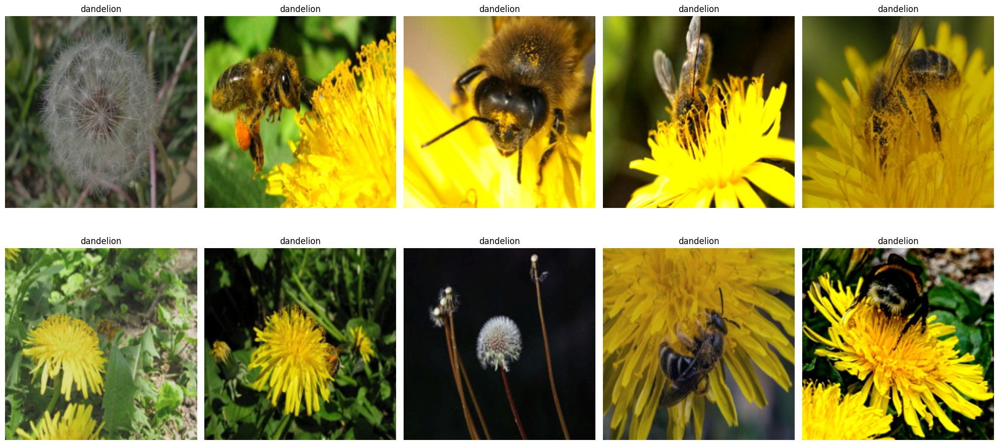

In [ ]:
# # Visualizzazione di un campione casuale di immagini dal dataset di addestramento (trainset)
#  2 righe per 5 colonne di immagini (totale 10 immagini)

num_row = 2
num_col = 5
iteration =np.random.randint(0, len(trainset)-10)
mode = np.random.randint(0,3)
fig, axes = plt.subplots(num_row, num_col, figsize=(10*num_row,2*num_col))
for i in range(num_row*num_col):
    ax = axes[i//num_col, i%num_col]
    ax.imshow(tensor_to_image(trainsets[mode][iteration + i][0]))
    ax.axis('off')
    ax.set_title('{}'.format(classes[int(trainsets[mode][iteration + i][1])]))
plt.tight_layout()
plt.show()




SCELTA DEL MODELLO

Per il task di classificazione binaria di fiori, sono stati scelti modelli convoluzionali pre-addestrati su ImageNet e adattati tramite classificatori custom per il fine-tuning. La selezione dei modelli è stata guidata dall’obiettivo di bilanciare accuratezza, complessità computazionale e dimensione del modello.

I modelli considerati sono:

VGG16_bn: rete a blocchi convoluzionali e fully connected, relativamente semplice, usata sia come baseline che per esperimenti senza pretraining.

ResNet18: reti con collegamenti residui, robuste su pattern complessi, particolarmente efficaci in fase di fine-tuning.

MobileNetV2: architettura leggera ed efficiente, adatta per ambienti a bassa potenza computazionale.

EfficientNet_b0: bilanciamento ottimale tra parametri, accuratezza e velocità, con una struttura moderna basata su compound scaling.

DenseNet121: rete con connessioni dense tra i layer, capace di apprendere feature complesse con una maggiore efficienza.

MODALITÀ DI TUNING E IPERPARAMETRI

Per gestire in modo flessibile il processo di sperimentazione e permettere un bilanciamento tra accuratezza e costi computazionali, sono state definite due modalità di tuning: easy e deep. Ciascuna modalità controlla quali modelli, ottimizzatori e numero di epoche vengono utilizzati, ma soprattutto lavora in combinazione con tre diversi livelli di data augmentation (light, medium, deep), ciascuno applicato tramite un trainloader specifico.

Durante il training, infatti, il modello viene addestrato tre volte – una per ciascun livello di data augmentation – il che consente di osservare come ogni architettura reagisca a un diverso grado di variabilità e complessità nei dati di input. Questo approccio è particolarmente utile per comprendere la robustezza e la capacità di generalizzazione dei modelli in condizioni sempre più sfidanti.


La modalità easy è progettata per test rapidi, utile nelle fasi iniziali del progetto o in ambienti con risorse computazionali limitate. In questa modalità si lavora con un sottoinsieme di modelli leggeri, come vgg16_bn e resnet18, entrambi inizializzati con pesi pre-addestrati. L’ottimizzazione viene effettuata solo con SGD a learning rate 1e-3, e il training è condotto su un numero ridotto di epoche (10/20).

Sebbene i modelli siano meno numerosi e l’addestramento più rapido, anche in questa modalità ogni modello viene testato su tutti e tre i livelli di data augmentation:

- Light: applica modifiche leggere, come il ridimensionamento, un flip orizzontale casuale e lievi variazioni di luminosità e contrasto. È pensata per aumentare la generalizzazione del modello senza alterare troppo le caratteristiche visive originali.

- Medium: introduce variazioni più complesse: oltre ai flip orizzontali e verticali, aggiunge leggere rotazioni, traslazioni e cambi di scala. Colori e tonalità sono più variabili, e si aggiunge una sfocatura gaussiana. È adatta a simulare condizioni di scatto realistiche ma non estreme.



- Deep: affini più marcate, modifiche cromatiche più intense (soprattutto sul tono), e una combinazione di distorsioni più spinte. È utile per rendere il modello robusto a condizioni visive difficili o rumorose.

La modalità deep rappresenta invece la configurazione più completa. Include un insieme più ampio di modelli, con architetture complesse e di comprovata efficacia come resnet18, densenet121 ed efficientnet_b0, oltre a mobilenet_v2 e vgg16_bn. I modelli sono addestrati con diversi ottimizzatori, tra cui Adam e SGD, entrambi con weight decay e learning rate pari a 1e-3, al fine di esplorare differenti traiettorie di ottimizzazione.

Il training viene eseguito per 10, 20 o 50 epoche, a seconda del setup, e beneficia della presenza di un early stopping configurato per interrompere l’apprendimento in caso di stagnazione. Anche in questa modalità, ogni modello viene addestrato con tutte e tre le varianti di data augmentation, garantendo così una valutazione comparativa completa e dettagliata su come la qualità e la quantità delle trasformazioni influenzano l’apprendimento e la generalizzazione.

In [ ]:
## MODALITA DI TUNING
##
# Modalità di tuning: 'deep' per ricerca completa, 'easy' per ricerca rapida
# Analisi errori effettuata con tuning deep

mode = 'easy'  # cambiare in 'easy' per la ricerca rapida

# mode deep 5 hours
# mode easy 80 min
# dettagli modalità piu in basso ↓↓↓

In [ ]:


class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.min_val_loss = None
        self.counter = 0
        self.early_stop = False
        self.best_epoch = None
        self.trainer = None



    def reset(self):
        self.min_val_loss = None
        self.counter = 0
        self.early_stop = False
        self.best_epoch = None
        self.early_stop = False


    def __call__(self, validation_loss, model, epoch = None):
        if self.min_val_loss is None:
            self.min_val_loss = validation_loss
            self.save_checkpoint()
            self.best_epoch = epoch

        elif (self.min_val_loss - validation_loss) > self.min_delta:
            self.min_val_loss = validation_loss
            self.save_checkpoint()
            self.counter = 0
            self.best_epoch = epoch


        else:  # Nessun miglioramento
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                print(f"Modello salvato in {self.trainer.get_path()}")


    def save_checkpoint(self):
      self.trainer.save_model_and_log()



**CLASSE *TRAINER***

La classe Trainer è pensata per gestire in modo completo e modulare l’addestramento e la validazione di modelli PyTorch. Supporta il training su batch, l’uso di diversi ottimizzatori, early stopping, e il monitoraggio di metriche come loss e accuratezza. Include funzioni per salvare i modelli, visualizzare grafici di performance e analizzare errori tramite matrici di confusione, , rendendola uno strumento flessibile per sperimentazioni sul task di classificazione.

In [ ]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tqdm import tqdm


class Trainer:
    def __init__(self, model, name, criterion, device, train_loader, val_loader, classes=None, early_stopping=None, logger = None):
        self.model = model.to(device)
        self.name = name
        self.criterion = criterion
        self.device = device
        self.classes = classes
        self.train_loader = train_loader
        self.test_loader = val_loader

        self.optimizer = None
        self.optimizer_name = None


        self.logger = logger
        self.last_training_info = None



    def set_early_stopping(self, early_stopping):
        self.early_stopping = early_stopping
        self.early_stopping.trainer = self

    def set_optimizer(self, optimizer, name):
        self.optimizer = optimizer
        self.optimizer_name = name

    def train_epoch(self,optimizer = None):
        if optimizer is None:
          optimizer = self.optimizer
        self.model.train()
        running_loss = 0.0
        processed_data = 0
        for data in tqdm(self.train_loader,desc='Train_epoch in progress'):
            inputs, labels = data[0].to(self.device), data[1].float().unsqueeze(1).to(self.device)
            optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()*inputs.size(0)
            processed_data += len(inputs)

        return running_loss / processed_data

    def test_epoch(self, test_loader=None):
        if test_loader is None:
            test_loader = self.test_loader
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for data in tqdm(test_loader,desc='Test_epoch in progress'):
                inputs, labels = data[0].to(self.device), data[1].float().unsqueeze(1).to(self.device)
                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)

                running_loss += loss.item()*inputs.size(0)
                probs = torch.sigmoid(outputs)
                predicted = (probs > 0.5).int()
                labels_int = labels.int()

                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels_int.cpu().numpy())


                correct += (predicted == labels_int).sum().item()
                total += labels.size(0)
        f1 = f1_score(all_labels, all_preds)
        return running_loss / total, correct / total, f1

    def final_validation(self,test_loader=None):
        _, accuracy, f1 = self.test_epoch(test_loader)
        self.last_training_info['final_accuracy'] = accuracy
        self.last_training_info['final_f1'] = f1
        return accuracy, f1



    def train(self, test_loader=None, epochs=100, experiment_name=None, optimizer=None):

        if self.early_stopping is not None:
            self.early_stopping.reset()
        if optimizer is None:
            optimizer = self.optimizer
        if self.optimizer is None and optimizer is None:
            raise ValueError("Optimizer not set. Use set_optimizer() before training.")

        if test_loader is None:
            test_loader = self.test_loader

        train_losses = []
        val_losses = []
        val_accuracies = []
        val_f1 = []
        best_epoch = None

        for epoch in tqdm(range(epochs), desc="Training Progress"):

            train_loss = self.train_epoch(optimizer)
            val_loss, val_accuracy, f1  = self.test_epoch(test_loader)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            val_accuracies.append(val_accuracy)
            val_f1.append(f1)

            tqdm.write(f'Epoch {epoch+1}/{epochs}, F1 score:{f1:.4f}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

            if self.early_stopping is not None:
                self.early_stopping(val_loss, self.model, epoch)
                if self.early_stopping.early_stop:
                    best_epoch =  self.early_stopping.best_epoch
                    print("Early stopping")
                    break

        epochs_run = epoch + 1
        if experiment_name is None:
            experiment_name = f"experiment_{len(self.logger.get_all())+ 1}"



        exp_record = {
            "experiment_name": experiment_name,
            "optimizer": self.optimizer_name,
            "criterion": type(self.criterion).__name__,
            "train_losses": train_losses,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "val_f1": val_f1,
            "epochs_run": epochs_run,
            "best_epoch_early_stopping": best_epoch
        }
        self.logger.log(exp_record)

        self.last_training_info = exp_record
        if not self.early_stopping.early_stop:
            self.save_model_and_log()
            print(f"Model salvato in {self.name}/model.pt")
        self.early_stopping.reset()
        self.save_model_and_log(log_filename = f"log_{experiment_name}.json", log_data = exp_record)

        return val_f1, train_losses, val_losses, val_accuracies, epochs_run, best_epoch


    def plot_accuracies(self):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.get_cmap('tab10')
        for i,exp in enumerate(self.logger.get_all()):
            color = colors(i % 10)
            epochs = range(1, exp["epochs_run"] + 1)
            plt.plot(epochs, exp["val_accuracies"], label=f'Val Accuracy ({exp["optimizer"]}-Epoche:{exp["epochs_run"]})',color=color)

            # Linea verticale miglior val accuracy (best_epoch)
            if exp.get("best_epoch_early_stopping") is not None:
                plt.axvline(exp["best_epoch_early_stopping"] + 1, color=color, linestyle='--', alpha=0.7,
                            label=f'Best Val Accuracy Epoch - ({exp["optimizer"]}-Epoche:{exp["best_epoch_early_stopping"]})')



        plt.xlabel("Epochs")
        plt.ylabel("Validation Accuracy")
        plt.title(f"{self.name} - Validation Accuracy")
        plt.legend()
        plt.show()

    def plot_losses_bar(self):
        experiment_names = []
        train_losses = []
        val_losses = []

        for i, exp in enumerate(self.logger.get_all()):
            name = f"{exp['optimizer']}-Epochs:{exp['epochs_run']}"
            experiment_names.append(name)

            best_epoch = exp.get("best_epoch_early_stopping")
            if best_epoch is not None:
                train_losses.append(exp["train_losses"][best_epoch])
                val_losses.append(exp["val_losses"][best_epoch])
            else:
                train_losses.append(exp["train_losses"][-1])
                val_losses.append(exp["val_losses"][-1])

        x = range(len(experiment_names))
        width = 0.35

        plt.figure(figsize=(12, 6))
        plt.bar([xi - width/2 for xi in x], train_losses, width=width, label="Train Loss", color="skyblue")
        plt.bar([xi + width/2 for xi in x], val_losses, width=width, label="Val Loss", color="salmon")

        plt.xticks(x, experiment_names, rotation=45, ha="right")
        plt.ylabel("Loss")
        plt.title(f"{self.name} - Best Train/Validation Loss ")
        plt.legend()
        plt.tight_layout()
        plt.grid(axis="y", linestyle="--", alpha=0.5)
        plt.show()

    def plot_f1_scores(self):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.get_cmap('tab10')
        for i, exp in enumerate(self.logger.get_all()):
            if "val_f1" not in exp:
                continue
            f1_scores = exp["val_f1"]
            epochs = range(1, len(f1_scores) + 1)
            color = colors(i % 10)
            plt.plot(epochs, f1_scores, label=f'Val F1-score ({exp["optimizer"]}-Epochs:{exp["epochs_run"]})', color=color)

            # Linea verticale miglior epoca (early stopping)
            if exp.get("best_epoch_early_stopping") is not None:
                plt.axvline(exp["best_epoch_early_stopping"] + 1, color=color, linestyle='--', alpha=0.7,
                            label=f'Best Val F1 Epoch ({exp["optimizer"]}-Epochs:{exp["best_epoch_early_stopping"]})')

        plt.xlabel("Epochs")
        plt.ylabel("Validation F1-score")
        plt.title(f"{self.name} - Validation F1-score")
        plt.legend()
        plt.grid(True)
        plt.show()



    def get_last_training_info(self):
          print("="*50)
          print(f"Experiment Summary: {self.last_training_info.get('experiment_name', 'N/A')}")
          print("-"*50)
          print(f"Optimizer:           {self.last_training_info.get('optimizer', 'N/A')}")
          print(f"Criterion:           {self.last_training_info.get('criterion', 'N/A')}")
          print(f"Epochs Run:          {self.last_training_info.get('epochs_run', 'N/A')}")
          print(f"best_epoch_early_stopping: {self.last_training_info.get('best_epoch_early_stopping', 'N/A')}")
          print("-"*50)
          print(f"Final Training Loss: {self.last_training_info['train_losses'][-1]:.4f}")
          print(f"Final Validation Loss: {self.last_training_info['val_losses'][-1]:.4f}")
          print(f"Final Validation Accuracy: {self.last_training_info['final_accuracy']:.4f}")
          print(f"Final F1 score: {self.last_training_info['final_f1']:.4f}")
          print("="*50)
          return self.last_training_info



    def plot_confusion_matrix(self, test_loader=None):
            if test_loader is None:
                test_loader = self.test_loader
            self.model.eval()
            y_true = []
            y_pred = []

            with torch.no_grad():
                for i, data in enumerate(test_loader, 0):
                    inputs, labels = data[0].to(self.device), data[1].to(self.device)
                    outputs = self.model(inputs)
                    probs = torch.sigmoid(outputs)
                    predicted = (probs > 0.5).long().squeeze()
                    y_true.extend(labels.cpu().numpy())
                    y_pred.extend(predicted.cpu().numpy())

            cm = confusion_matrix(y_true, y_pred)
            plt.figure(figsize=(6,5))
            sns.heatmap(cm, annot=True, fmt='d',
                        xticklabels=self.classes,
                        yticklabels=self.classes, cmap='Blues')
            plt.xlabel('Predicted')
            plt.ylabel('True')

            title = f"\n{model_name} with {opt_name} optimizer for {epochs} epochs"
            plt.title(f"Confusion Matrix Binary: {title}\n", color='blue')
            plt.tight_layout()
            plt.show()

    def save_model_and_log(self, model_filename="model.pt", log_filename=None, log_data=None):
            folder = os.path.join("models", self.name)
            os.makedirs(folder, exist_ok=True)

            model_path = os.path.join(folder, model_filename)




            if log_filename is not None and log_data is not None:
                log_path = os.path.join(folder, log_filename)
                with open(log_path, 'w') as f:
                    json.dump(log_data, f, indent=4)
                print(f"Log salvato in: {log_path}")
            else:
              torch.save(self.model.state_dict(), model_path)



    def load_model(self, model_filename="model.pt"):
            model_path = os.path.join("models", self.name, model_filename)
            if os.path.isfile(model_path):
                self.model.load_state_dict(torch.load(model_path, map_location=self.device))
                self.model.to(self.device)
                print(f"Modello caricato da: {model_path}")
            else:
                print(f"File non trovato: {model_path}")

    def get_path(self):
            return "models/"+self.name

    def show_errors(self, test_loader=None, max_errors=10):
            if test_loader is None:
                test_loader = self.test_loader
            self.model.eval()

            all_wrong_images = []
            all_true_labels = []
            all_pred_labels = []

            with torch.no_grad():
                for inputs, labels in test_loader:
                    inputs = inputs.to(self.device)
                    labels = labels.to(self.device)
                    outputs = self.model(inputs)
                    probs = torch.sigmoid(outputs)
                    preds = (probs > 0.5).long().squeeze(dim = 1)
                    labels = labels.squeeze()

                    wrong_idxs = (preds != labels).nonzero(as_tuple=False).squeeze()
                    if wrong_idxs.dim() == 0 and wrong_idxs.numel() > 0:
                        wrong_idxs = wrong_idxs.unsqueeze(0)

                    for idx in wrong_idxs:
                        all_wrong_images.append(inputs[idx].cpu())
                        all_true_labels.append(labels[idx].item())
                        all_pred_labels.append(preds[idx].item())

            if len(all_wrong_images) > max_errors:
                selected_idxs = random.sample(range(len(all_wrong_images)), max_errors)
            else:
                selected_idxs = range(len(all_wrong_images))

            plt.figure(figsize=(15, 8))
            for i, idx in enumerate(selected_idxs):
                plt.subplot(2, 5, i + 1)
                plt.imshow(tensor_to_image(all_wrong_images[idx]))
                true_label = self.classes[all_true_labels[idx]] if self.classes else all_true_labels[idx]
                pred_label = self.classes[all_pred_labels[idx]] if self.classes else all_pred_labels[idx]
                plt.title(f"True: {true_label}\nPred: {pred_label}")
                plt.axis('off')

            plt.show()

## Il codice delle funzioni relative all'implementazione dei grafici/ errori è stato realizzato in parte con l'aiuto di chat-GPT.

**CLASSE *COMPARATOR***

La classe ModelComparer permette di gestire e confrontare facilmente più modelli di machine learning tenendo traccia delle loro configurazioni (nome modello, ottimizzatore, numero di epoche, data augmentation) e dei relativi risultati di training e validazione. Attraverso metodi dedicati, consente di registrare le metriche di performance come loss e accuracy, associandole a ciascun modello, e offre funzioni di visualizzazione per comparare graficamente l'andamento delle loss e dell’accuratezza nel corso delle epoche, evidenziando anche l’epoca con le migliori performance (early stopping).

In [ ]:

class ModelComparator:
    def __init__(self, name):
        self.models_logs = {}  # chiave = f"{model}_{optimizer}_{epochs}"
        self.name = name

    def add_model(self, model_name, optimizer_name, epochs):
        key = f"{model_name}_{optimizer_name}_{epochs}ep"
        self.models_logs[key] = {
            "model_name": model_name,
            "optimizer_name": optimizer_name,
            "epochs": epochs,
            "train_losses": None,
            "val_losses": None,
            "val_accuracies": None,
            "best_epoch": None,
            "epochs_run": None,
            "f1_scores": None,
        }
        return key

    def results_model(self, key, f1_sc, train_losses, val_losses, val_accuracies, epochs_run, best_epoch):
       old_dict = self.models_logs[key]
       self.models_logs[key] ={
           "model_name": old_dict["model_name"],
           "optimizer_name": old_dict["optimizer_name"],
           "epochs": old_dict["epochs"],
           "train_losses": train_losses,
           "val_losses": val_losses,
           "val_accuracies": val_accuracies,
           "best_epoch": best_epoch,
           "epochs_run": epochs_run,
           "f1_scores": f1_sc
       }



    def plot_loss_train(self):


        optimizers = set(log["optimizer_name"] for log in self.models_logs.values())
        epochs_list = set(log["epochs"] for log in self.models_logs.values())

        for optimizer in sorted(optimizers):
            for epochs in sorted(epochs_list):
                plt.figure(figsize=(12, 6))
                colors = plt.cm.get_cmap('tab10')
                plt.title(f"Train Loss - {optimizer} - {epochs} Epochs - {self.name}")
                plt.xlabel("Epoch")
                plt.ylabel("Loss")
                i = 0
                for log in self.models_logs.values():
                    if log["optimizer_name"] == optimizer and log["epochs"] == epochs:
                        color = colors(i % 10)
                        i += 1
                        label = f"{log['model_name']} ({optimizer})"
                        plt.plot(range(1, len(log["train_losses"]) + 1), log["train_losses"], label=label, color = color)
                        if log["best_epoch"] is not None:
                          plt.axvline(log["best_epoch"], color=color, linestyle='--', alpha=0.7, label=f"{log['model_name']} stop best epoch {log['best_epoch']}")



                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()


    def plot_loss_validate(self):
        import matplotlib.pyplot as plt

        optimizers = set(log["optimizer_name"] for log in self.models_logs.values())
        epochs_list = set(log["epochs"] for log in self.models_logs.values())

        for optimizer in sorted(optimizers):
            for epochs in sorted(epochs_list):
                plt.figure(figsize=(12, 6))
                colors = plt.cm.get_cmap('tab10')
                plt.title(f"Validation Loss - {optimizer} - {epochs} Epochs - {self.name}")
                plt.xlabel("Epoch")
                plt.ylabel("Loss")
                i = 0
                for log in self.models_logs.values():
                    if log["optimizer_name"] == optimizer and log["epochs"] == epochs:
                        color = colors(i % 10)
                        i += 1
                        label = f"{log['model_name']} ({optimizer})"
                        plt.plot(range(1, len(log["val_losses"]) + 1), log["val_losses"], label=label, color = color)
                        if log["best_epoch"] is not None:
                          plt.axvline(log["best_epoch"], color=color, linestyle='--', alpha=0.7, label=f"{log['model_name']} stop best epoch {log['best_epoch']}")


                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()

    def plot_accuracy(self):
        import matplotlib.pyplot as plt

        optimizers = set(log["optimizer_name"] for log in self.models_logs.values())
        epochs_list = set(log["epochs"] for log in self.models_logs.values())

        for optimizer in sorted(optimizers):
            for epochs in sorted(epochs_list):
                plt.figure(figsize=(12, 6))
                colors = plt.cm.get_cmap('tab10')
                plt.title(f"Validation Accuracy - {optimizer} - {epochs} Epochs - {self.name}")
                plt.xlabel("Epoch")
                plt.ylabel("Accuracy")
                i = 0
                for log in self.models_logs.values():
                    if log["optimizer_name"] == optimizer and log["epochs"] == epochs:
                        color = colors(i % 10)
                        i += 1
                        label = f"{log['model_name']} ({optimizer})"
                        plt.plot(range(1, len(log["val_accuracies"]) + 1), log["val_accuracies"], label=label,color = color)
                        if log["best_epoch"] is not None:
                          plt.axvline(log["best_epoch"], color=color, linestyle='--', alpha=0.7, label=f"{log['model_name']} stop best epoch {log['best_epoch']}")

                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()


    def plot_f1_scores(self):
        import matplotlib.pyplot as plt

        optimizers = set(log["optimizer_name"] for log in self.models_logs.values())
        epochs_list = set(log["epochs"] for log in self.models_logs.values())

        for optimizer in sorted(optimizers):
            for epochs in sorted(epochs_list):
                plt.figure(figsize=(12, 6))
                colors = plt.cm.get_cmap('tab10')
                plt.title(f"Validation F1-score - {optimizer} - {epochs} Epochs - {self.name}")
                plt.xlabel("Epoch")
                plt.ylabel("F1-score")
                i = 0
                for log in self.models_logs.values():
                    if log["optimizer_name"] == optimizer and log["epochs"] == epochs and log["f1_scores"] is not None:
                        color = colors(i % 10)
                        i += 1
                        label = f"{log['model_name']} ({optimizer})"
                        plt.plot(range(1, len(log["f1_scores"]) + 1), log["f1_scores"], label=label, color=color)
                        if log["best_epoch"] is not None:
                            plt.axvline(log["best_epoch"], color=color, linestyle='--', alpha=0.7, label=f"{log['model_name']} stop best epoch {log['best_epoch']}")

                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()


In [ ]:
# La classe ExperimentLogger serve a registrare, salvare e consultare le informazioni
# relative agli esperimenti effettuati durante il training dei modelli.
# È utile per confrontare i risultati (es. loss, accuracy, parametri) tra diversi run
# e per tenere traccia delle configurazioni testate.

class ExperimentLogger:
    def __init__(self):
        self.experiments = []

    def log(self, experiment_info):
        self.experiments.append(experiment_info)

    def get_all(self):
        return self.experiments

    def last(self):
        return self.experiments[-1] if self.experiments else None

**MODELLI**

Per tale task di classificazione si procede alla scelta di svariati modelli classici del deep learning, tutti preaddestrati su ImageNet e riadattati per una classificazione binaria ( num_classes = 1 ) . La presenza di architetture diverse, da VGG16 con batch normalization fino a EfficientNet-B0, permette di confrontare approcci classici e moderni sia in termini di accuratezza che di efficienza computazionale. VGG16 rappresenta una rete profonda tradizionale, molto pesante ma stabile, mentre ResNet18 introduce i blocchi residui per facilitare l’apprendimento in reti profonde. MobileNetV2 e EfficientNet-B0 sono invece ottimizzati per ambienti a bassa potenza, mantenendo buone prestazioni pur con pochi parametri. DenseNet121 offre un compromesso interessante tra profondità, riuso delle feature e compattezza. Questa collezione consente quindi una valutazione ampia e bilanciata dei modelli, adattabile a contesti differenti: da ambienti embedded fino a sistemi server più potenti. Inoltre, grazie al pretraining, si parte da una base efficiente, accelerando la convergenza nel fine-tuning su dataset specifici.












In [ ]:
# Definizione criterion e optimizer da settare per ogni modello
criterion = nn.BCEWithLogitsLoss()


# Per ottimizzare i tempi di training e rendere la sperimentazione più gestibile,
# si è scelto un sottoinsieme rappresentativo di modelli e ottimizzatori.
# Questa scelta consente un buon equilibrio tra varietà di architetture e parametri
# e la praticabilità computazionale, evitando un numero eccessivo di combinazioni
# che renderebbero la ricerca troppo lunga e complessa.





# Modalità di tuning: 'deep' per ricerca completa, 'easy' per ricerca rapida
# Analisi errori effettuata con tuning deep
#
# se vuoi cambiare modalità, cerca il blocco codice su con "mode=xxxx" ↑↑↑↑

#
#
#
#


if mode == 'deep':
    # Modalità deep: più modelli, ottimizzatori e epoche
    models = {
       "vgg16_bn": lambda : create_model("vgg16_bn", pretrained=True, num_classes=1),
       "resnet18": lambda: create_model("resnet18", pretrained=True, num_classes=1),
       "mobilenet_v2": lambda: create_model("mobilenet_v2", pretrained=True, num_classes=1),
       "efficientnet_b0": lambda: create_model("efficientnet_b0", pretrained=True, num_classes=1),
       "densenet121": lambda: create_model("densenet121", pretrained=True, num_classes=1),
    }




    optimizers = {
        #"Adam_1e-3": lambda m: torch.optim.Adam(m.parameters(), lr=1e-3, weight_decay=1e-4),  # prestazioni poco rilevanti
        "SGD_1e-3": lambda m: torch.optim.SGD(m.parameters(), lr=1e-3, momentum=0.9, weight_decay=1e-4),
    }

    epoch_list = [10,20,50]

elif mode == 'easy':
    # Modalità easy: meno modelli, ottimizzatori e epoche per test veloci
    models = {
        "vgg16_bn": lambda : create_model("vgg16_bn", pretrained=True, num_classes=1),
        "resnet18": lambda: create_model("resnet18", pretrained=True, num_classes=1),

    }

    optimizers = {
       "SGD_1e-3": lambda m: torch.optim.SGD(m.parameters(), lr=1e-3, momentum=0.9, weight_decay=1e-4),
    }

    epoch_list = [10,20]  # meno epoche per velocizzare

else:
    raise ValueError("Modalità sconosciuta. Usa 'deep' o 'easy'")

# Ora puoi usare questi dizionari nel training loop
print(f"Modalità selezionata: {mode}")
print(f"Modelli usati: {list(models.keys())}")
print(f"Ottimizzatori usati: {list(optimizers.keys())}")
print(f"Epoche usate: {epoch_list}")

Modalità selezionata: easy
Modelli usati: ['vgg16_bn', 'resnet18']
Ottimizzatori usati: ['SGD_1e-3']
Epoche usate: [10, 20]


 
Training light model vgg16_bn with SGD_1e-3 optimizer for 10 epochs


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/554M [00:00<?, ?B/s]

Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:   0%|          | 0/10 [00:46<?, ?it/s]

Epoch 1/10, F1 score:0.9284, Train Loss: 0.4235, Val Loss: 0.1920, Val Acc: 0.9203


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:  10%|█         | 1/10 [01:35<07:29, 49.91s/it]

Epoch 2/10, F1 score:0.9514, Train Loss: 0.1567, Val Loss: 0.1343, Val Acc: 0.9478


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.01s/it]

Training Progress:  20%|██        | 2/10 [02:32<07:12, 54.10s/it]

Epoch 3/10, F1 score:0.9550, Train Loss: 0.1001, Val Loss: 0.1025, Val Acc: 0.9505


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.01s/it]

Training Progress:  30%|███       | 3/10 [03:23<06:09, 52.79s/it]

Epoch 4/10, F1 score:0.9572, Train Loss: 0.0681, Val Loss: 0.0976, Val Acc: 0.9533


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  40%|████      | 4/10 [04:15<05:14, 52.45s/it]

Epoch 5/10, F1 score:0.9622, Train Loss: 0.0504, Val Loss: 0.0936, Val Acc: 0.9588


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  50%|█████     | 5/10 [05:08<04:22, 52.53s/it]

Epoch 6/10, F1 score:0.9600, Train Loss: 0.0436, Val Loss: 0.0876, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  70%|███████   | 7/10 [06:00<02:30, 50.04s/it]

Epoch 7/10, F1 score:0.9622, Train Loss: 0.0295, Val Loss: 0.0919, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.01s/it]

Training Progress:  80%|████████  | 8/10 [06:45<01:36, 48.49s/it]

Epoch 8/10, F1 score:0.9624, Train Loss: 0.0274, Val Loss: 0.0909, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.01s/it]

Training Progress:  90%|█████████ | 9/10 [07:30<00:47, 47.34s/it]

Epoch 9/10, F1 score:0.9650, Train Loss: 0.0207, Val Loss: 0.0882, Val Acc: 0.9615



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.01s/it]

Training Progress:  90%|█████████ | 9/10 [08:14<00:47, 47.34s/it]

Epoch 10/10, F1 score:0.9648, Train Loss: 0.0144, Val Loss: 0.0854, Val Acc: 0.9615


Training Progress: 100%|██████████| 10/10 [08:20<00:00, 50.10s/it]


Model salvato in light vgg16_bn/model.pt
Log salvato in: models/light vgg16_bn/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.0144
Final Validation Loss: 0.0854
Final Validation Accuracy: 0.9615
Final F1 score: 0.9665


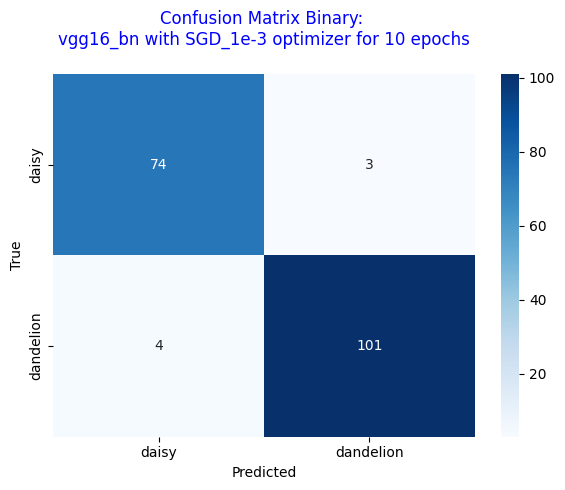

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



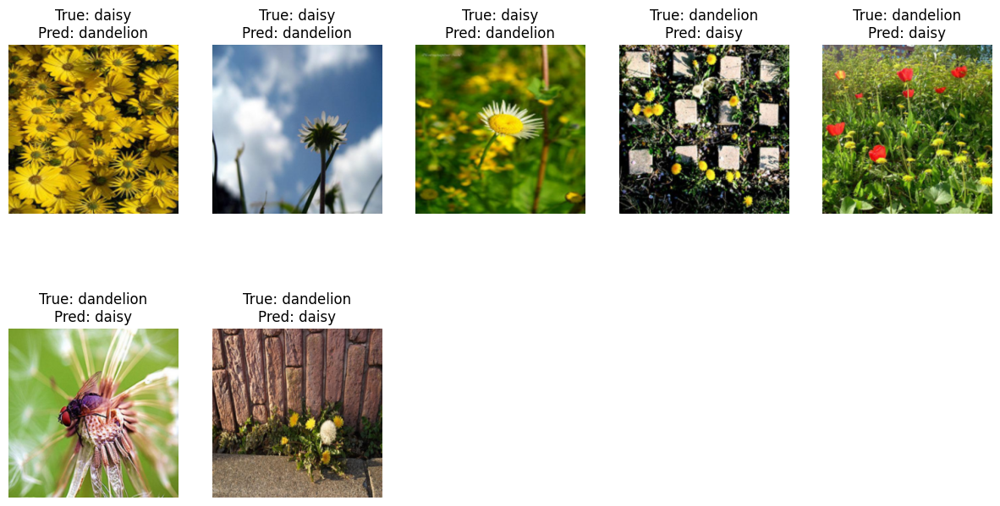

 
Training light model vgg16_bn with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]

Training Progress:   0%|          | 0/20 [00:46<?, ?it/s]

Epoch 1/20, F1 score:0.8987, Train Loss: 0.4224, Val Loss: 0.2217, Val Acc: 0.8929


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:   5%|▌         | 1/20 [01:40<17:14, 54.42s/it]

Epoch 2/20, F1 score:0.9543, Train Loss: 0.1701, Val Loss: 0.1278, Val Acc: 0.9505


Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  10%|█         | 2/20 [02:36<16:43, 55.74s/it]

Epoch 3/20, F1 score:0.9552, Train Loss: 0.1072, Val Loss: 0.1048, Val Acc: 0.9505


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:  20%|██        | 4/20 [03:28<13:33, 50.82s/it]

Epoch 4/20, F1 score:0.9541, Train Loss: 0.0683, Val Loss: 0.1064, Val Acc: 0.9505



Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:  20%|██        | 4/20 [04:14<13:33, 50.82s/it]

Epoch 5/20, F1 score:0.9624, Train Loss: 0.0529, Val Loss: 0.0971, Val Acc: 0.9588


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]

Training Progress:  25%|██▌       | 5/20 [05:11<13:11, 52.78s/it]

Epoch 6/20, F1 score:0.9600, Train Loss: 0.0410, Val Loss: 0.0950, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:  35%|███▌      | 7/20 [06:08<11:09, 51.49s/it]

Epoch 7/20, F1 score:0.9594, Train Loss: 0.0357, Val Loss: 0.0958, Val Acc: 0.9560



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  35%|███▌      | 7/20 [06:53<11:09, 51.49s/it]

Epoch 8/20, F1 score:0.9624, Train Loss: 0.0237, Val Loss: 0.0883, Val Acc: 0.9588


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]

Training Progress:  40%|████      | 8/20 [07:46<10:20, 51.71s/it]

Epoch 9/20, F1 score:0.9652, Train Loss: 0.0201, Val Loss: 0.0822, Val Acc: 0.9615


Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]

Training Progress:  50%|█████     | 10/20 [08:44<08:34, 51.49s/it]

Epoch 10/20, F1 score:0.9624, Train Loss: 0.0147, Val Loss: 0.0855, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  55%|█████▌    | 11/20 [09:30<07:26, 49.62s/it]

Epoch 11/20, F1 score:0.9596, Train Loss: 0.0209, Val Loss: 0.0942, Val Acc: 0.9560



Train_epoch in progress: 100%|██████████| 40/40 [00:41<00:00,  1.03s/it]

Training Progress:  60%|██████    | 12/20 [10:15<06:27, 48.42s/it]

Epoch 12/20, F1 score:0.9626, Train Loss: 0.0106, Val Loss: 0.0893, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  65%|██████▌   | 13/20 [11:01<05:32, 47.48s/it]

Epoch 13/20, F1 score:0.9701, Train Loss: 0.0081, Val Loss: 0.0834, Val Acc: 0.9670



Train_epoch in progress: 100%|██████████| 40/40 [00:40<00:00,  1.02s/it]

Training Progress:  65%|██████▌   | 13/20 [11:46<06:20, 54.37s/it]


Epoch 14/20, F1 score:0.9724, Train Loss: 0.0111, Val Loss: 0.0862, Val Acc: 0.9698
Modello salvato in models/light vgg16_bn
Early stopping
Log salvato in: models/light vgg16_bn/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          14
best_epoch_early_stopping: 8
--------------------------------------------------
Final Training Loss: 0.0111
Final Validation Loss: 0.0862
Final Validation Accuracy: 0.9560
Final F1 score: 0.9615


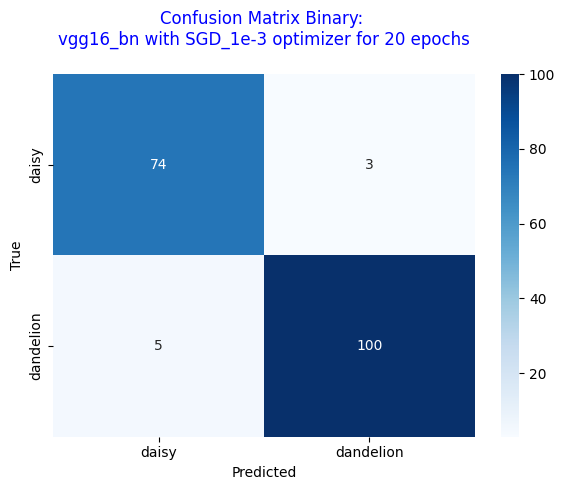

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



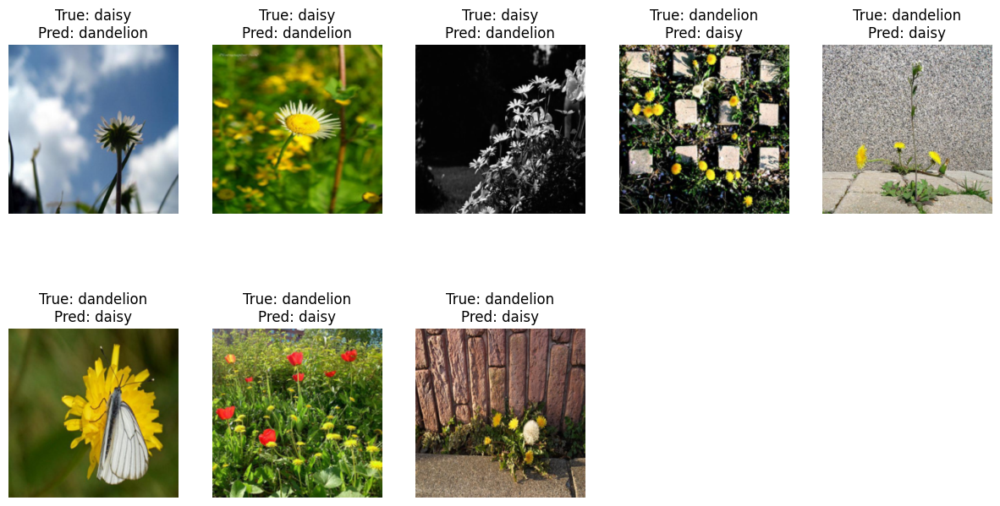

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


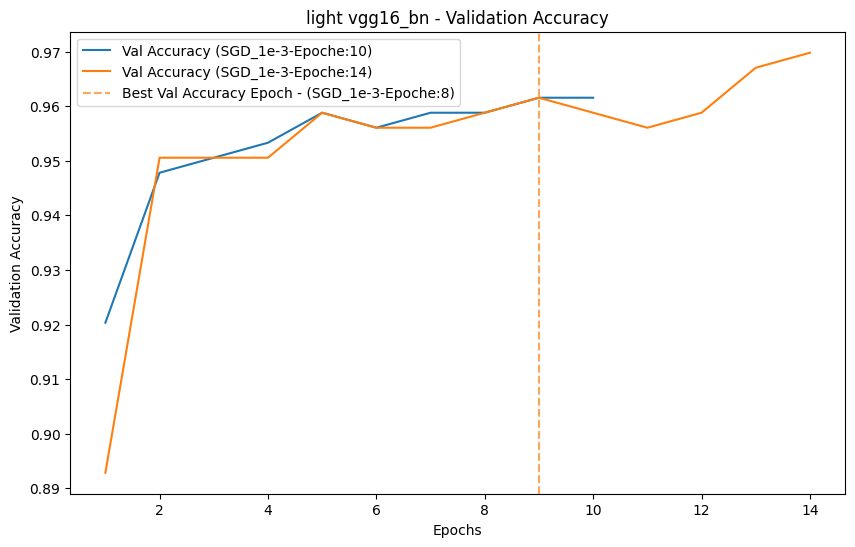

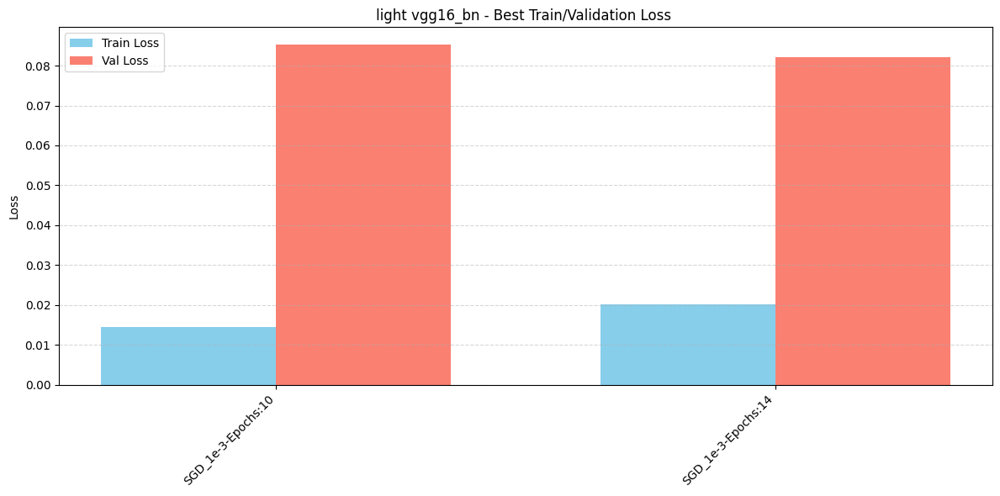

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


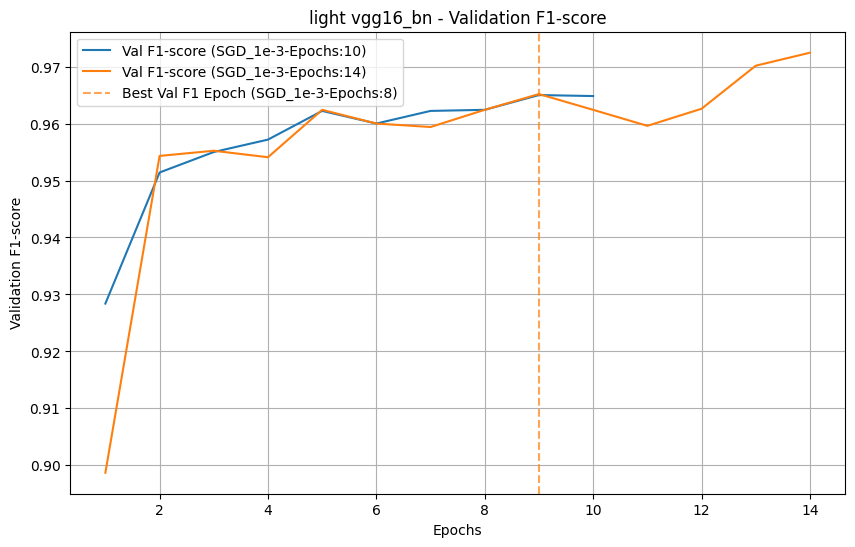

 
Training light model resnet18 with SGD_1e-3 optimizer for 10 epochs


model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.74it/s]

Training Progress:  10%|█         | 1/10 [00:17<02:35, 17.28s/it]

Epoch 1/10, F1 score:0.7463, Train Loss: 0.6534, Val Loss: 0.6332, Val Acc: 0.6264



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.82it/s]

Training Progress:  20%|██        | 2/10 [00:34<02:16, 17.04s/it]

Epoch 2/10, F1 score:0.8295, Train Loss: 0.5969, Val Loss: 0.5747, Val Acc: 0.7775



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.79it/s]

Training Progress:  30%|███       | 3/10 [00:51<02:01, 17.34s/it]

Epoch 3/10, F1 score:0.9023, Train Loss: 0.5377, Val Loss: 0.5117, Val Acc: 0.8846



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.75it/s]

Training Progress:  40%|████      | 4/10 [01:09<01:43, 17.32s/it]

Epoch 4/10, F1 score:0.9112, Train Loss: 0.4909, Val Loss: 0.4785, Val Acc: 0.8956



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.79it/s]

Training Progress:  50%|█████     | 5/10 [01:26<01:26, 17.23s/it]

Epoch 5/10, F1 score:0.9400, Train Loss: 0.4554, Val Loss: 0.4310, Val Acc: 0.9313



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.73it/s]

Training Progress:  60%|██████    | 6/10 [01:44<01:09, 17.44s/it]

Epoch 6/10, F1 score:0.9291, Train Loss: 0.4219, Val Loss: 0.3881, Val Acc: 0.9203



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.76it/s]

Training Progress:  70%|███████   | 7/10 [02:01<00:52, 17.39s/it]

Epoch 7/10, F1 score:0.9289, Train Loss: 0.3906, Val Loss: 0.3633, Val Acc: 0.9176



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.78it/s]

Training Progress:  80%|████████  | 8/10 [02:18<00:34, 17.30s/it]

Epoch 8/10, F1 score:0.9212, Train Loss: 0.3606, Val Loss: 0.3465, Val Acc: 0.9121



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.71it/s]

Training Progress:  90%|█████████ | 9/10 [02:36<00:17, 17.41s/it]

Epoch 9/10, F1 score:0.9346, Train Loss: 0.3358, Val Loss: 0.3168, Val Acc: 0.9258



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.79it/s]

Training Progress: 100%|██████████| 10/10 [02:53<00:00, 17.32s/it]


Epoch 10/10, F1 score:0.9330, Train Loss: 0.3129, Val Loss: 0.2926, Val Acc: 0.9258
Model salvato in light resnet18/model.pt
Log salvato in: models/light resnet18/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  4.87it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.3129
Final Validation Loss: 0.2926
Final Validation Accuracy: 0.9011
Final F1 score: 0.9174


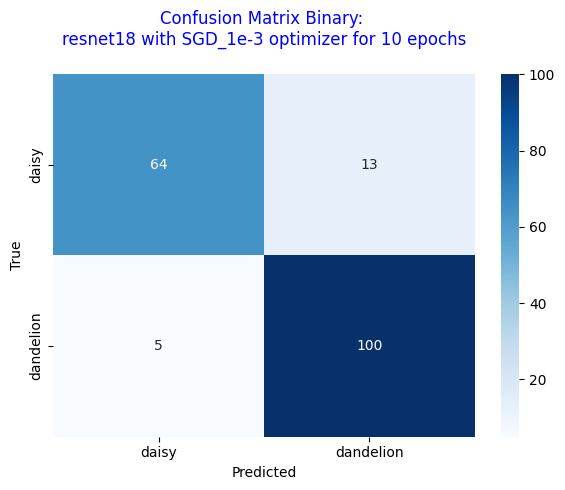

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



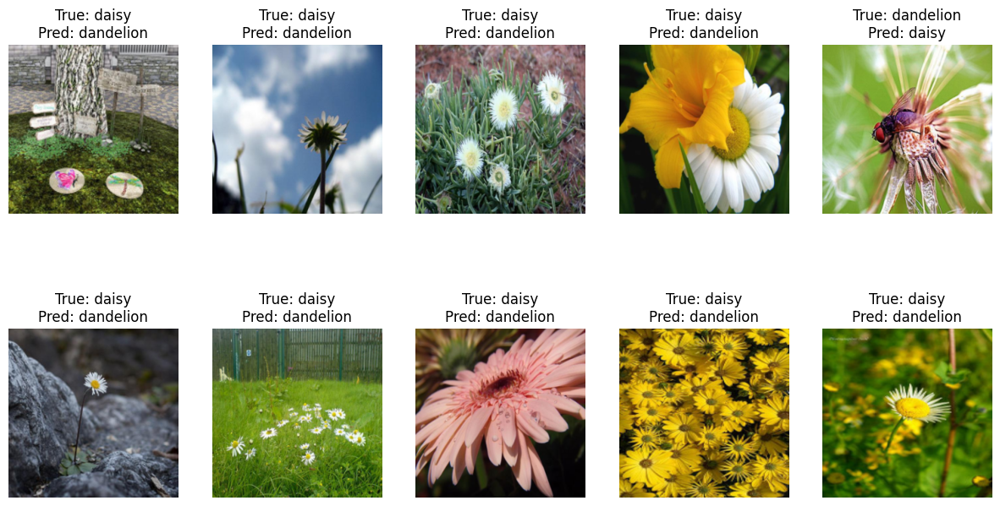

 
Training light model resnet18 with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.67it/s]

Training Progress:   5%|▌         | 1/20 [00:17<05:40, 17.93s/it]

Epoch 1/20, F1 score:0.7256, Train Loss: 0.6669, Val Loss: 0.6386, Val Acc: 0.5824



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.66it/s]

Training Progress:  10%|█         | 2/20 [00:36<05:24, 18.05s/it]

Epoch 2/20, F1 score:0.8344, Train Loss: 0.6038, Val Loss: 0.5779, Val Acc: 0.7830



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.58it/s]

Training Progress:  15%|█▌        | 3/20 [00:54<05:10, 18.28s/it]

Epoch 3/20, F1 score:0.8828, Train Loss: 0.5477, Val Loss: 0.5242, Val Acc: 0.8599



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.63it/s]

Training Progress:  20%|██        | 4/20 [01:12<04:51, 18.25s/it]

Epoch 4/20, F1 score:0.9069, Train Loss: 0.5016, Val Loss: 0.4806, Val Acc: 0.8929



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.63it/s]

Training Progress:  25%|██▌       | 5/20 [01:31<04:35, 18.40s/it]

Epoch 5/20, F1 score:0.9267, Train Loss: 0.4587, Val Loss: 0.4413, Val Acc: 0.9148



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.66it/s]

Training Progress:  30%|███       | 6/20 [01:49<04:15, 18.25s/it]

Epoch 6/20, F1 score:0.9208, Train Loss: 0.4311, Val Loss: 0.4081, Val Acc: 0.9121



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.62it/s]

Training Progress:  35%|███▌      | 7/20 [02:07<03:58, 18.34s/it]

Epoch 7/20, F1 score:0.9469, Train Loss: 0.4020, Val Loss: 0.3751, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.59it/s]

Training Progress:  40%|████      | 8/20 [02:26<03:40, 18.37s/it]

Epoch 8/20, F1 score:0.9353, Train Loss: 0.3724, Val Loss: 0.3592, Val Acc: 0.9258



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.68it/s]

Training Progress:  45%|████▌     | 9/20 [02:44<03:20, 18.22s/it]

Epoch 9/20, F1 score:0.9383, Train Loss: 0.3490, Val Loss: 0.3290, Val Acc: 0.9313



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.56it/s]

Training Progress:  50%|█████     | 10/20 [03:02<03:03, 18.35s/it]

Epoch 10/20, F1 score:0.9403, Train Loss: 0.3279, Val Loss: 0.2987, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.65it/s]

Training Progress:  55%|█████▌    | 11/20 [03:20<02:44, 18.26s/it]

Epoch 11/20, F1 score:0.9409, Train Loss: 0.3146, Val Loss: 0.2906, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.63it/s]

Training Progress:  60%|██████    | 12/20 [03:39<02:26, 18.36s/it]

Epoch 12/20, F1 score:0.9223, Train Loss: 0.2920, Val Loss: 0.2737, Val Acc: 0.9148



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.60it/s]

Training Progress:  65%|██████▌   | 13/20 [03:57<02:08, 18.37s/it]

Epoch 13/20, F1 score:0.9380, Train Loss: 0.2775, Val Loss: 0.2511, Val Acc: 0.9313



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.65it/s]

Training Progress:  70%|███████   | 14/20 [04:16<01:50, 18.36s/it]

Epoch 14/20, F1 score:0.9303, Train Loss: 0.2768, Val Loss: 0.2576, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.64it/s]

Training Progress:  75%|███████▌  | 15/20 [04:34<01:31, 18.30s/it]

Epoch 15/20, F1 score:0.9347, Train Loss: 0.2640, Val Loss: 0.2364, Val Acc: 0.9286



Train_epoch in progress: 100%|██████████| 40/40 [00:14<00:00,  2.67it/s]

Training Progress:  80%|████████  | 16/20 [04:52<01:12, 18.20s/it]

Epoch 16/20, F1 score:0.9347, Train Loss: 0.2545, Val Loss: 0.2346, Val Acc: 0.9286



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.55it/s]

Training Progress:  85%|████████▌ | 17/20 [05:11<00:54, 18.33s/it]

Epoch 17/20, F1 score:0.9273, Train Loss: 0.2418, Val Loss: 0.2241, Val Acc: 0.9203



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.66it/s]

Training Progress:  90%|█████████ | 18/20 [05:29<00:36, 18.23s/it]

Epoch 18/20, F1 score:0.9303, Train Loss: 0.2375, Val Loss: 0.2147, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.64it/s]

Training Progress:  95%|█████████▌| 19/20 [05:47<00:18, 18.32s/it]

Epoch 19/20, F1 score:0.9262, Train Loss: 0.2293, Val Loss: 0.2122, Val Acc: 0.9203



Train_epoch in progress: 100%|██████████| 40/40 [00:15<00:00,  2.64it/s]

Training Progress: 100%|██████████| 20/20 [06:05<00:00, 18.29s/it]


Epoch 20/20, F1 score:0.9383, Train Loss: 0.2233, Val Loss: 0.2096, Val Acc: 0.9313
Model salvato in light resnet18/model.pt
Log salvato in: models/light resnet18/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          20
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.2233
Final Validation Loss: 0.2096
Final Validation Accuracy: 0.9341
Final F1 score: 0.9434


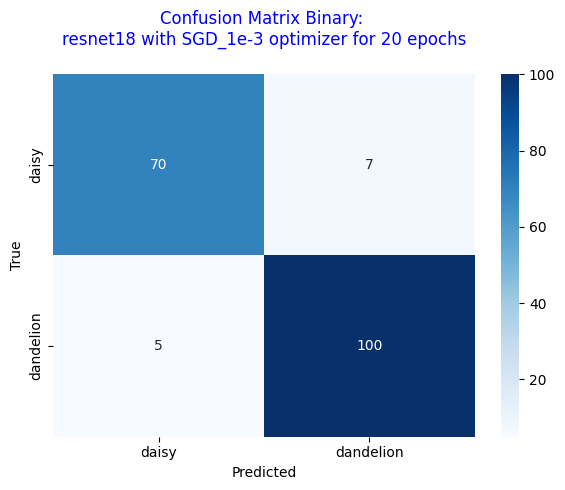

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



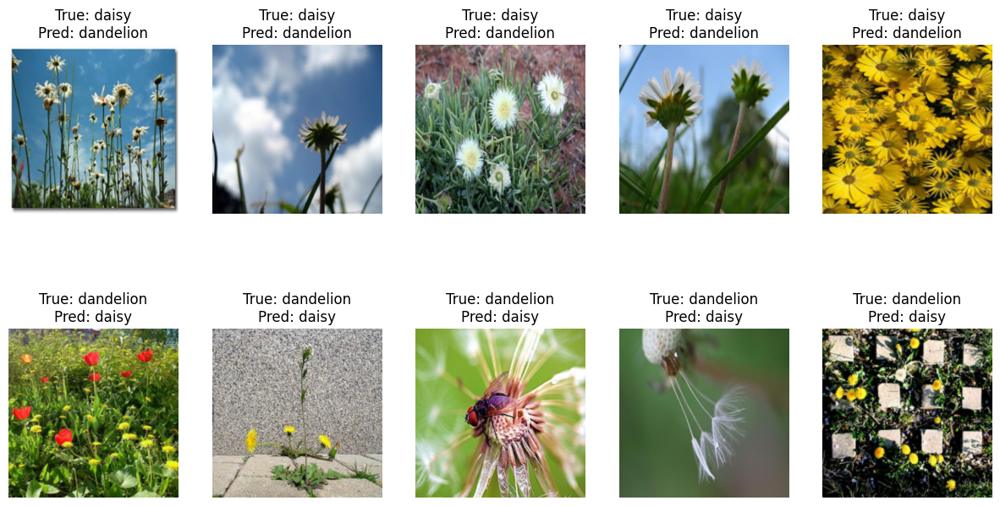

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


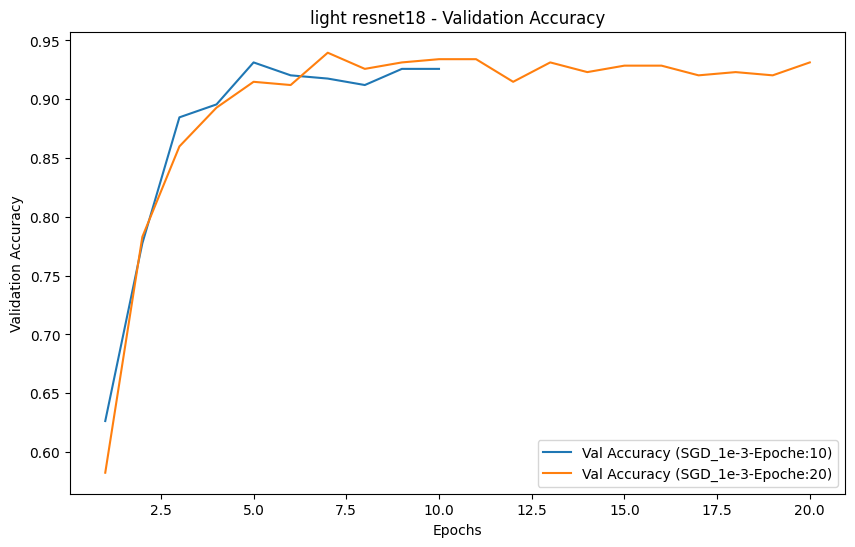

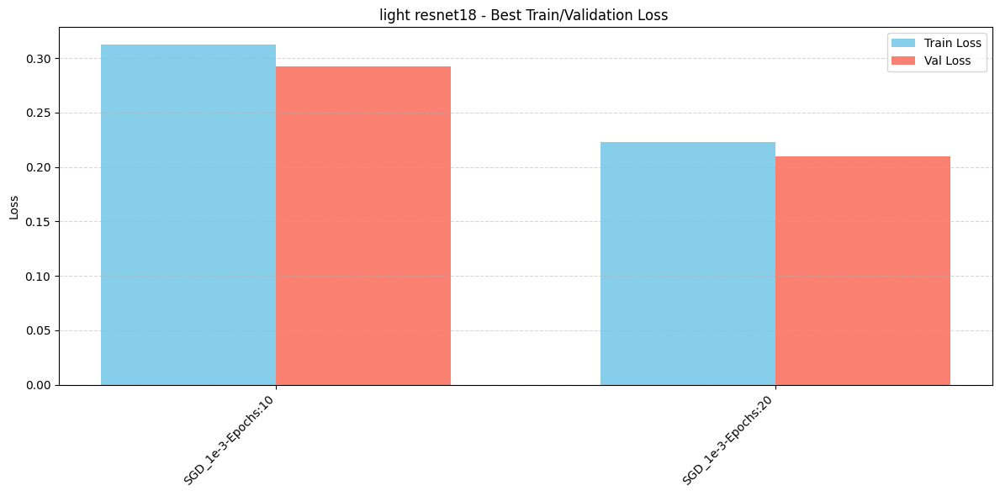

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


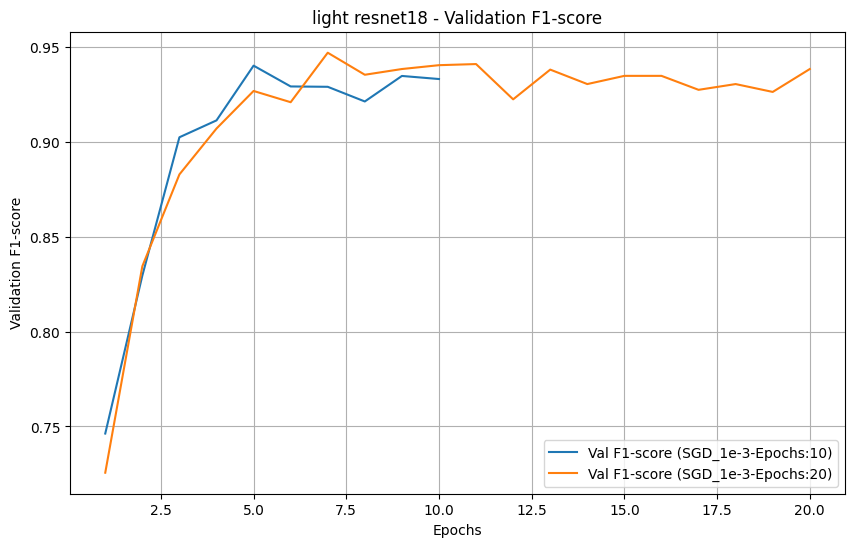

 
Training medium model vgg16_bn with SGD_1e-3 optimizer for 10 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:   0%|          | 0/10 [00:58<?, ?it/s]

Epoch 1/10, F1 score:0.8953, Train Loss: 0.4523, Val Loss: 0.2408, Val Acc: 0.8901


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  10%|█         | 1/10 [01:59<09:07, 60.83s/it]

Epoch 2/10, F1 score:0.9439, Train Loss: 0.1926, Val Loss: 0.1465, Val Acc: 0.9396


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  20%|██        | 2/10 [03:08<08:44, 65.62s/it]

Epoch 3/10, F1 score:0.9439, Train Loss: 0.1381, Val Loss: 0.1301, Val Acc: 0.9396


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  40%|████      | 4/10 [04:18<06:24, 64.02s/it]

Epoch 4/10, F1 score:0.9381, Train Loss: 0.1095, Val Loss: 0.1426, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  50%|█████     | 5/10 [05:16<05:09, 61.92s/it]

Epoch 5/10, F1 score:0.9433, Train Loss: 0.0890, Val Loss: 0.1319, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  50%|█████     | 5/10 [06:15<05:09, 61.92s/it]

Epoch 6/10, F1 score:0.9436, Train Loss: 0.0741, Val Loss: 0.1236, Val Acc: 0.9396


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  70%|███████   | 7/10 [07:20<03:05, 61.78s/it]

Epoch 7/10, F1 score:0.9430, Train Loss: 0.0704, Val Loss: 0.1254, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  70%|███████   | 7/10 [08:19<03:05, 61.78s/it]

Epoch 8/10, F1 score:0.9565, Train Loss: 0.0607, Val Loss: 0.1121, Val Acc: 0.9533


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  90%|█████████ | 9/10 [09:24<01:01, 61.62s/it]

Epoch 9/10, F1 score:0.9563, Train Loss: 0.0560, Val Loss: 0.1281, Val Acc: 0.9533



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  90%|█████████ | 9/10 [10:22<01:01, 61.62s/it]

Epoch 10/10, F1 score:0.9572, Train Loss: 0.0481, Val Loss: 0.1011, Val Acc: 0.9533


Training Progress: 100%|██████████| 10/10 [10:29<00:00, 62.93s/it]


Model salvato in medium vgg16_bn/model.pt
Log salvato in: models/medium vgg16_bn/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.55it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.0481
Final Validation Loss: 0.1011
Final Validation Accuracy: 0.9615
Final F1 score: 0.9668


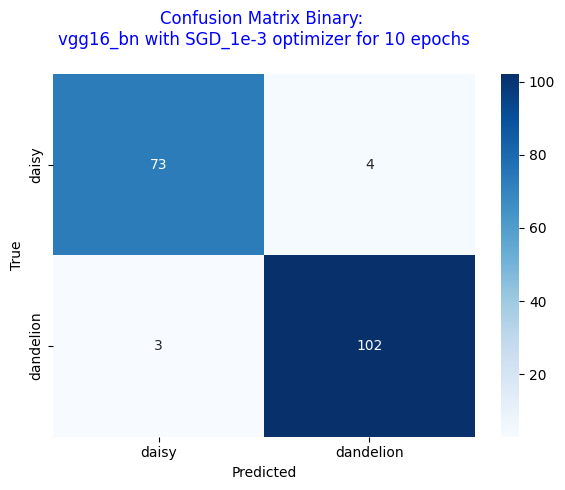

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



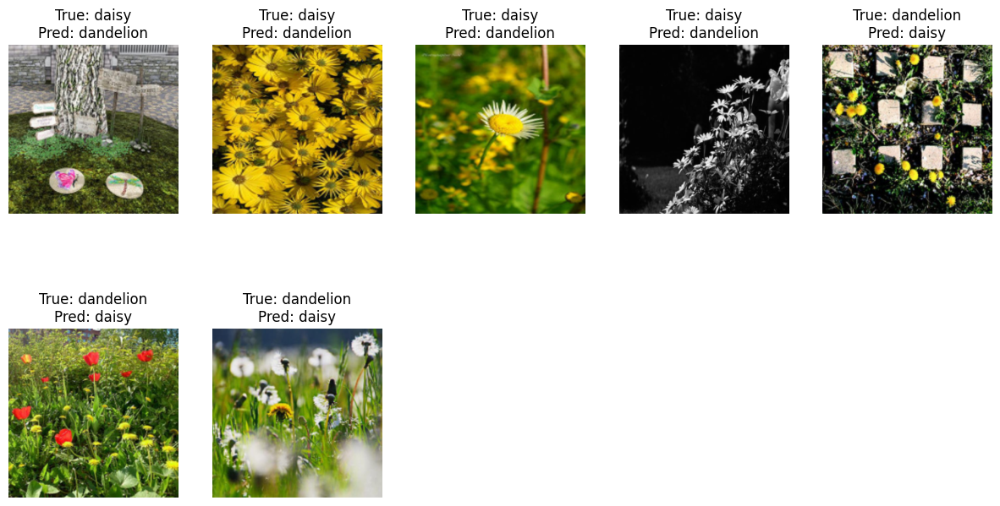

 
Training medium model vgg16_bn with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:   0%|          | 0/20 [00:59<?, ?it/s]

Epoch 1/20, F1 score:0.8710, Train Loss: 0.4458, Val Loss: 0.2615, Val Acc: 0.8681


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:   5%|▌         | 1/20 [02:08<22:03, 69.67s/it]

Epoch 2/20, F1 score:0.9191, Train Loss: 0.1910, Val Loss: 0.1624, Val Acc: 0.9148


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  10%|█         | 2/20 [03:14<20:11, 67.29s/it]

Epoch 3/20, F1 score:0.9519, Train Loss: 0.1379, Val Loss: 0.1288, Val Acc: 0.9478


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  15%|█▌        | 3/20 [04:24<19:23, 68.45s/it]

Epoch 4/20, F1 score:0.9570, Train Loss: 0.1149, Val Loss: 0.1173, Val Acc: 0.9533


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  25%|██▌       | 5/20 [05:29<16:04, 64.30s/it]

Epoch 5/20, F1 score:0.9433, Train Loss: 0.1042, Val Loss: 0.1460, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  25%|██▌       | 5/20 [06:28<16:04, 64.30s/it]

Epoch 6/20, F1 score:0.9570, Train Loss: 0.0789, Val Loss: 0.1015, Val Acc: 0.9533


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  30%|███       | 6/20 [07:33<15:01, 64.41s/it]

Epoch 7/20, F1 score:0.9598, Train Loss: 0.0652, Val Loss: 0.0961, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  35%|███▌      | 7/20 [08:34<13:44, 63.46s/it]

Epoch 8/20, F1 score:0.9596, Train Loss: 0.0550, Val Loss: 0.0907, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  40%|████      | 8/20 [09:44<13:02, 65.22s/it]

Epoch 9/20, F1 score:0.9622, Train Loss: 0.0515, Val Loss: 0.0872, Val Acc: 0.9588


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  50%|█████     | 10/20 [10:45<10:24, 62.49s/it]

Epoch 10/20, F1 score:0.9592, Train Loss: 0.0399, Val Loss: 0.0965, Val Acc: 0.9560



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  55%|█████▌    | 11/20 [11:44<09:12, 61.43s/it]

Epoch 11/20, F1 score:0.9645, Train Loss: 0.0416, Val Loss: 0.0937, Val Acc: 0.9615



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  60%|██████    | 12/20 [12:43<08:05, 60.74s/it]

Epoch 12/20, F1 score:0.9618, Train Loss: 0.0287, Val Loss: 0.0962, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:54<00:00,  1.35s/it]

Training Progress:  60%|██████    | 12/20 [13:42<08:05, 60.74s/it]

Epoch 13/20, F1 score:0.9648, Train Loss: 0.0298, Val Loss: 0.0828, Val Acc: 0.9615


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  70%|███████   | 14/20 [14:52<06:13, 62.22s/it]

Epoch 14/20, F1 score:0.9618, Train Loss: 0.0307, Val Loss: 0.1074, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.35s/it]

Training Progress:  75%|███████▌  | 15/20 [15:52<05:06, 61.33s/it]

Epoch 15/20, F1 score:0.9645, Train Loss: 0.0412, Val Loss: 0.1001, Val Acc: 0.9615



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  80%|████████  | 16/20 [16:50<04:02, 60.60s/it]

Epoch 16/20, F1 score:0.9673, Train Loss: 0.0191, Val Loss: 0.0855, Val Acc: 0.9643



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  80%|████████  | 16/20 [17:49<04:02, 60.60s/it]

Epoch 17/20, F1 score:0.9724, Train Loss: 0.0164, Val Loss: 0.0785, Val Acc: 0.9698


Train_epoch in progress: 100%|██████████| 40/40 [00:54<00:00,  1.35s/it]

Training Progress:  90%|█████████ | 18/20 [18:59<02:04, 62.04s/it]

Epoch 18/20, F1 score:0.9669, Train Loss: 0.0169, Val Loss: 0.0912, Val Acc: 0.9643



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress:  95%|█████████▌| 19/20 [19:58<01:01, 61.12s/it]

Epoch 19/20, F1 score:0.9700, Train Loss: 0.0136, Val Loss: 0.0840, Val Acc: 0.9670



Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.34s/it]

Training Progress: 100%|██████████| 20/20 [20:57<00:00, 62.87s/it]


Epoch 20/20, F1 score:0.9754, Train Loss: 0.0112, Val Loss: 0.0839, Val Acc: 0.9725
Model salvato in medium vgg16_bn/model.pt
Log salvato in: models/medium vgg16_bn/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          20
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.0112
Final Validation Loss: 0.0839
Final Validation Accuracy: 0.9615
Final F1 score: 0.9668


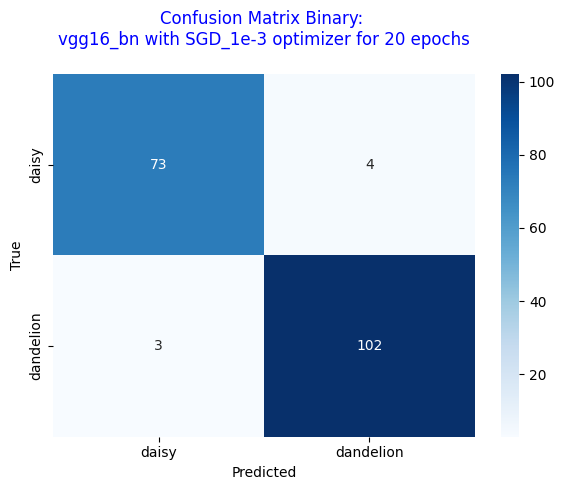

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



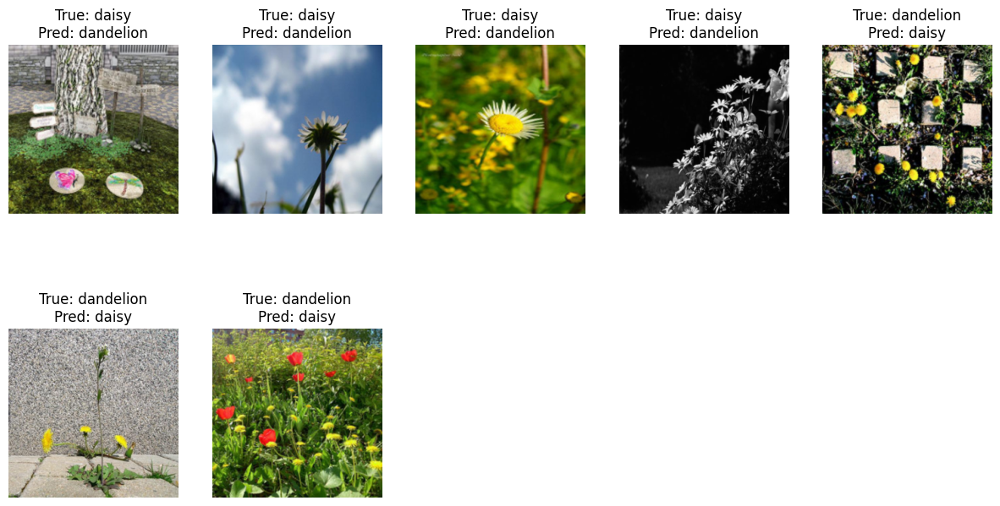

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


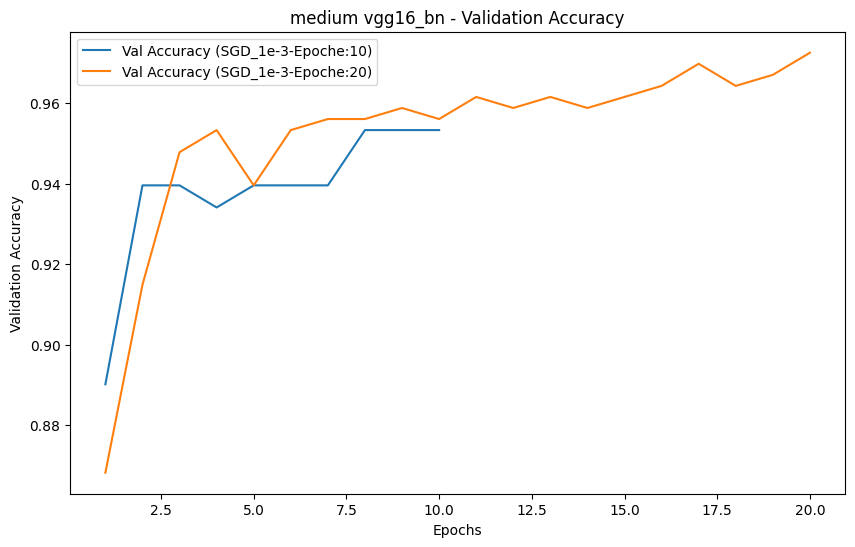

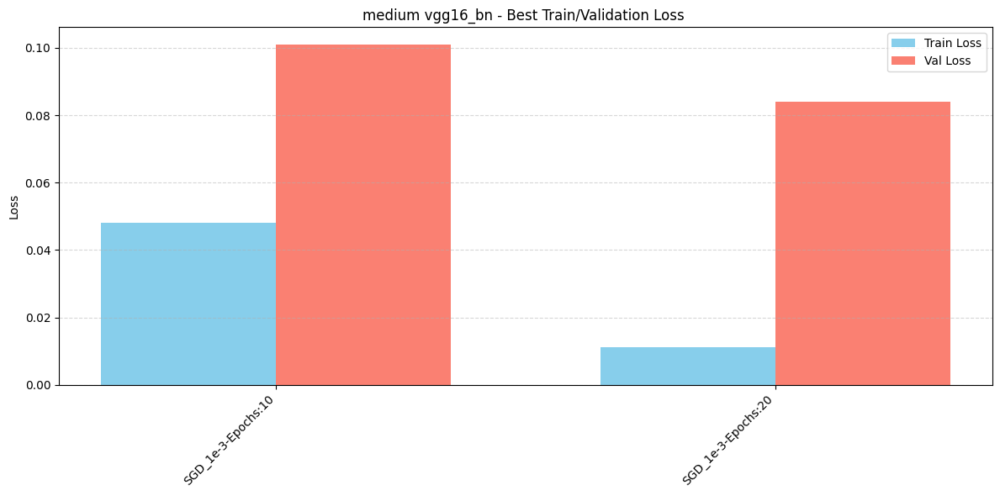

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


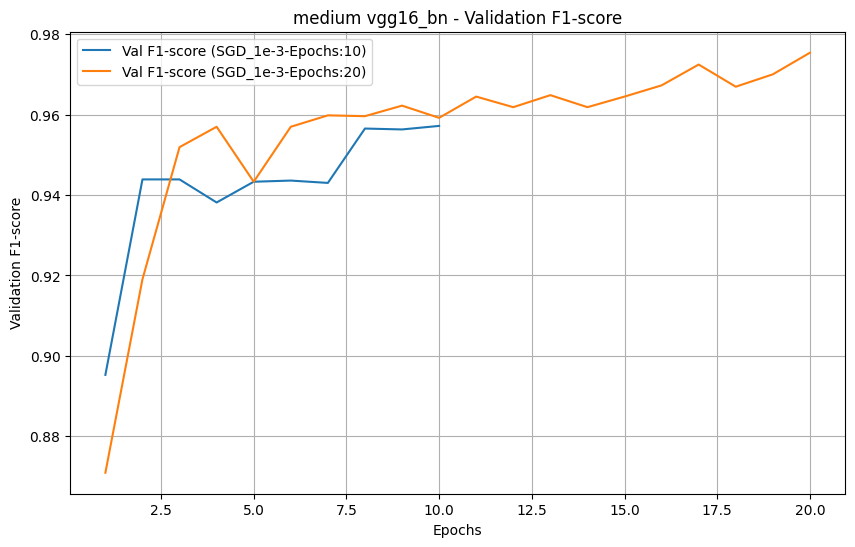

 
Training medium model resnet18 with SGD_1e-3 optimizer for 10 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  10%|█         | 1/10 [00:29<04:27, 29.69s/it]

Epoch 1/10, F1 score:0.7486, Train Loss: 0.6600, Val Loss: 0.6241, Val Acc: 0.6291



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.48it/s]

Training Progress:  20%|██        | 2/10 [01:00<04:01, 30.14s/it]

Epoch 2/10, F1 score:0.8715, Train Loss: 0.6061, Val Loss: 0.5745, Val Acc: 0.8379



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.47it/s]

Training Progress:  30%|███       | 3/10 [01:30<03:32, 30.32s/it]

Epoch 3/10, F1 score:0.9100, Train Loss: 0.5605, Val Loss: 0.5287, Val Acc: 0.8956



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.47it/s]

Training Progress:  40%|████      | 4/10 [02:01<03:02, 30.41s/it]

Epoch 4/10, F1 score:0.9078, Train Loss: 0.5223, Val Loss: 0.4886, Val Acc: 0.8956



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.47it/s]

Training Progress:  50%|█████     | 5/10 [02:31<02:32, 30.50s/it]

Epoch 5/10, F1 score:0.9104, Train Loss: 0.4789, Val Loss: 0.4434, Val Acc: 0.9011



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.46it/s]

Training Progress:  60%|██████    | 6/10 [03:02<02:02, 30.57s/it]

Epoch 6/10, F1 score:0.9177, Train Loss: 0.4432, Val Loss: 0.4137, Val Acc: 0.9093



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress:  70%|███████   | 7/10 [03:32<01:31, 30.44s/it]

Epoch 7/10, F1 score:0.9059, Train Loss: 0.4184, Val Loss: 0.3890, Val Acc: 0.8984



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.46it/s]

Training Progress:  80%|████████  | 8/10 [04:03<01:01, 30.56s/it]

Epoch 8/10, F1 score:0.9296, Train Loss: 0.3964, Val Loss: 0.3668, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress:  90%|█████████ | 9/10 [04:33<00:30, 30.45s/it]

Epoch 9/10, F1 score:0.9300, Train Loss: 0.3769, Val Loss: 0.3394, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.48it/s]

Training Progress: 100%|██████████| 10/10 [05:04<00:00, 30.42s/it]


Epoch 10/10, F1 score:0.9369, Train Loss: 0.3504, Val Loss: 0.3128, Val Acc: 0.9286
Model salvato in medium resnet18/model.pt
Log salvato in: models/medium resnet18/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  3.56it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.3504
Final Validation Loss: 0.3128
Final Validation Accuracy: 0.9066
Final F1 score: 0.9217


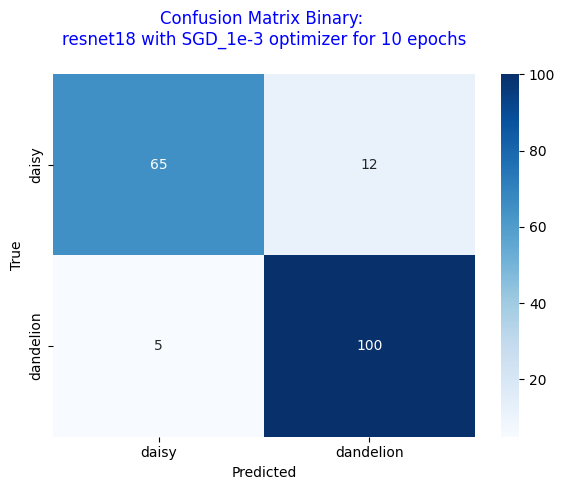

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



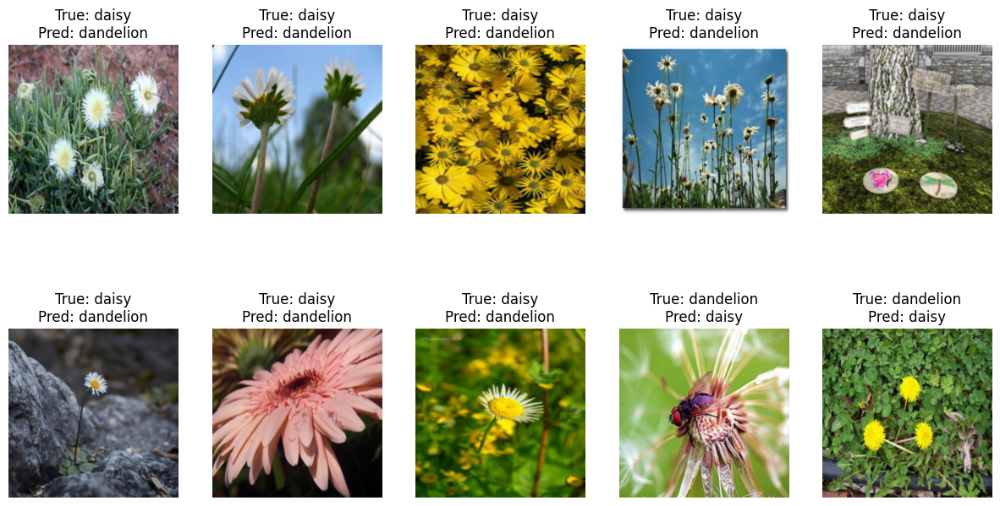

 
Training medium model resnet18 with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.47it/s]

Training Progress:   5%|▌         | 1/20 [00:30<09:38, 30.46s/it]

Epoch 1/20, F1 score:0.7384, Train Loss: 0.6668, Val Loss: 0.6362, Val Acc: 0.6126



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.43it/s]

Training Progress:  10%|█         | 2/20 [01:01<09:17, 30.96s/it]

Epoch 2/20, F1 score:0.8616, Train Loss: 0.6081, Val Loss: 0.5776, Val Acc: 0.8297



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.42it/s]

Training Progress:  15%|█▌        | 3/20 [01:33<08:50, 31.20s/it]

Epoch 3/20, F1 score:0.8943, Train Loss: 0.5605, Val Loss: 0.5240, Val Acc: 0.8819



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.43it/s]

Training Progress:  20%|██        | 4/20 [02:04<08:19, 31.23s/it]

Epoch 4/20, F1 score:0.9013, Train Loss: 0.5143, Val Loss: 0.4846, Val Acc: 0.8929



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.43it/s]

Training Progress:  25%|██▌       | 5/20 [02:36<07:51, 31.41s/it]

Epoch 5/20, F1 score:0.9280, Train Loss: 0.4771, Val Loss: 0.4352, Val Acc: 0.9203



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress:  30%|███       | 6/20 [03:07<07:17, 31.28s/it]

Epoch 6/20, F1 score:0.9188, Train Loss: 0.4422, Val Loss: 0.4074, Val Acc: 0.9121



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress:  35%|███▌      | 7/20 [03:38<06:46, 31.28s/it]

Epoch 7/20, F1 score:0.9377, Train Loss: 0.4217, Val Loss: 0.3775, Val Acc: 0.9313



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.43it/s]

Training Progress:  40%|████      | 8/20 [04:09<06:15, 31.27s/it]

Epoch 8/20, F1 score:0.8924, Train Loss: 0.3903, Val Loss: 0.3593, Val Acc: 0.8874



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.43it/s]

Training Progress:  45%|████▌     | 9/20 [04:41<05:43, 31.27s/it]

Epoch 9/20, F1 score:0.9096, Train Loss: 0.3697, Val Loss: 0.3346, Val Acc: 0.9038



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.43it/s]

Training Progress:  50%|█████     | 10/20 [05:12<05:13, 31.35s/it]

Epoch 10/20, F1 score:0.9235, Train Loss: 0.3592, Val Loss: 0.3140, Val Acc: 0.9176



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.43it/s]

Training Progress:  55%|█████▌    | 11/20 [05:43<04:42, 31.36s/it]

Epoch 11/20, F1 score:0.9300, Train Loss: 0.3321, Val Loss: 0.3007, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress:  60%|██████    | 12/20 [06:15<04:10, 31.33s/it]

Epoch 12/20, F1 score:0.9316, Train Loss: 0.3261, Val Loss: 0.2774, Val Acc: 0.9258



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.41it/s]

Training Progress:  65%|██████▌   | 13/20 [06:46<03:39, 31.40s/it]

Epoch 13/20, F1 score:0.9147, Train Loss: 0.3190, Val Loss: 0.2782, Val Acc: 0.9093



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.43it/s]

Training Progress:  70%|███████   | 14/20 [07:18<03:08, 31.34s/it]

Epoch 14/20, F1 score:0.9184, Train Loss: 0.2997, Val Loss: 0.2765, Val Acc: 0.9121



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.42it/s]

Training Progress:  75%|███████▌  | 15/20 [07:49<02:37, 31.47s/it]

Epoch 15/20, F1 score:0.9231, Train Loss: 0.2876, Val Loss: 0.2616, Val Acc: 0.9176



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress:  80%|████████  | 16/20 [08:20<02:05, 31.35s/it]

Epoch 16/20, F1 score:0.9397, Train Loss: 0.2845, Val Loss: 0.2391, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.42it/s]

Training Progress:  85%|████████▌ | 17/20 [08:52<01:34, 31.38s/it]

Epoch 17/20, F1 score:0.9286, Train Loss: 0.2666, Val Loss: 0.2314, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:28<00:00,  1.42it/s]

Training Progress:  90%|█████████ | 18/20 [09:23<01:02, 31.38s/it]

Epoch 18/20, F1 score:0.9447, Train Loss: 0.2630, Val Loss: 0.2246, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress:  95%|█████████▌| 19/20 [09:54<00:31, 31.25s/it]

Epoch 19/20, F1 score:0.9195, Train Loss: 0.2708, Val Loss: 0.2265, Val Acc: 0.9148



Train_epoch in progress: 100%|██████████| 40/40 [00:27<00:00,  1.44it/s]

Training Progress: 100%|██████████| 20/20 [10:25<00:00, 31.30s/it]


Epoch 20/20, F1 score:0.9397, Train Loss: 0.2597, Val Loss: 0.2023, Val Acc: 0.9341
Model salvato in medium resnet18/model.pt
Log salvato in: models/medium resnet18/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          20
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.2597
Final Validation Loss: 0.2023
Final Validation Accuracy: 0.9286
Final F1 score: 0.9372


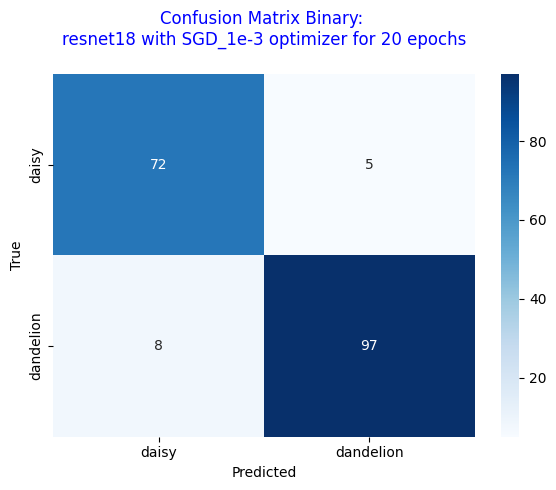

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



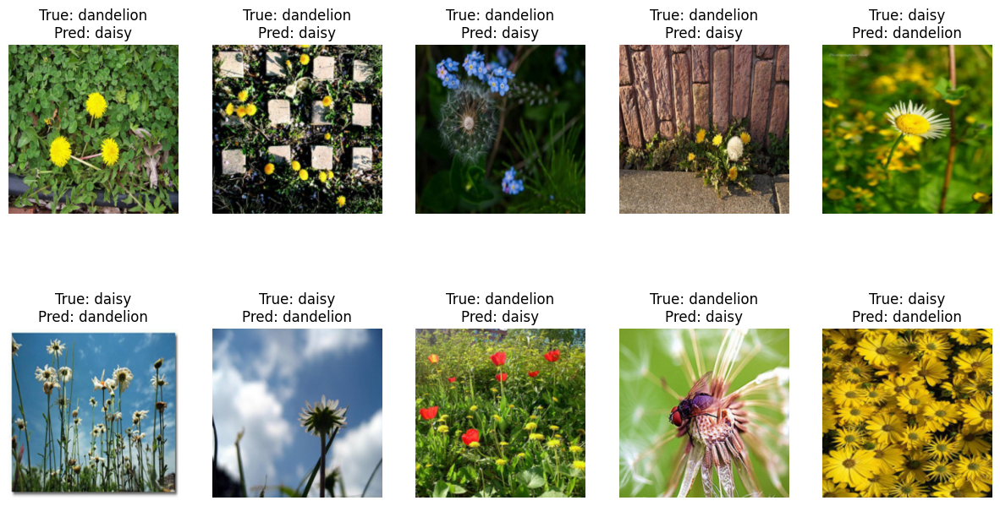

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


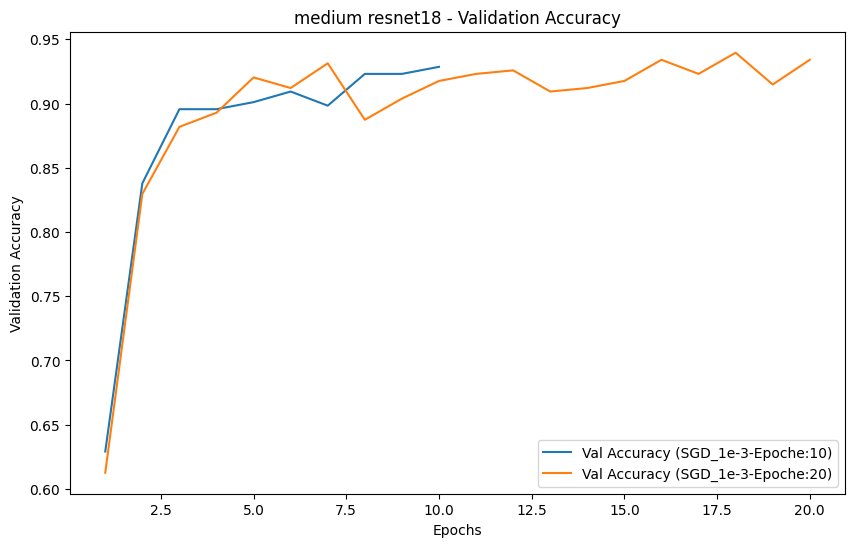

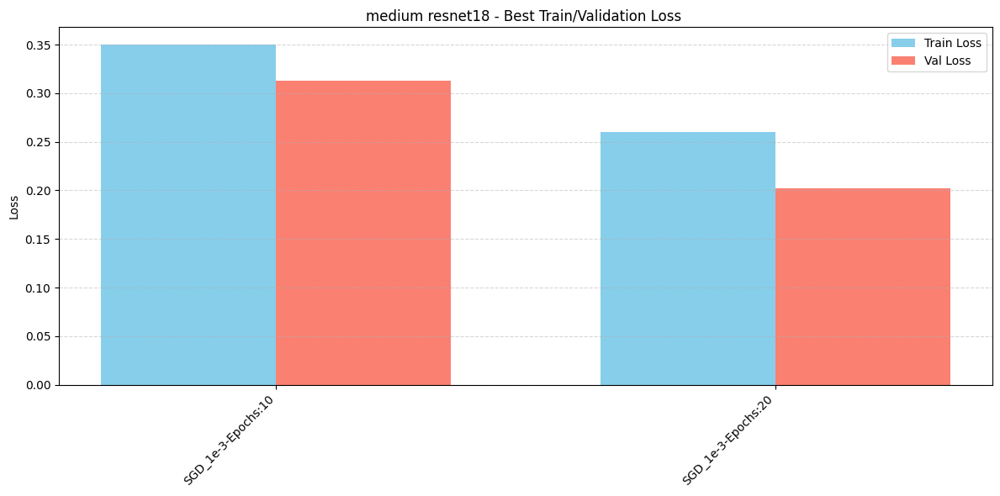

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


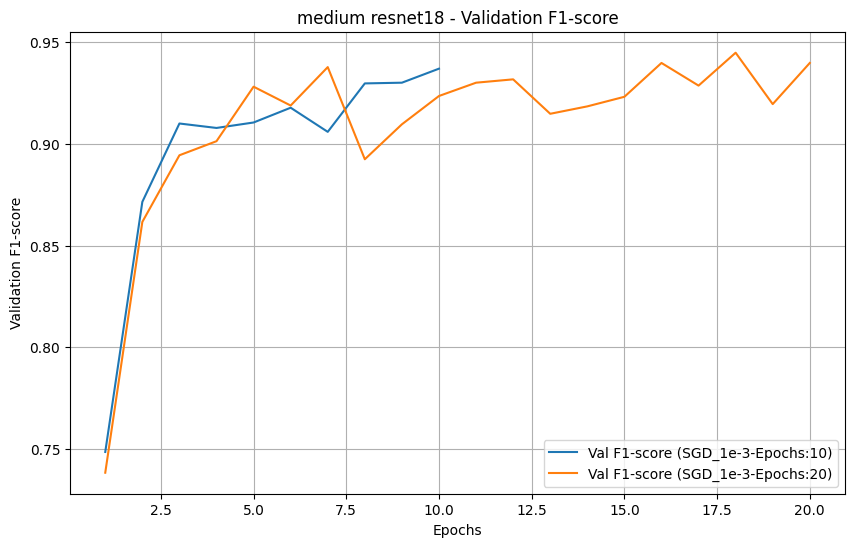

 
Training deep model vgg16_bn with SGD_1e-3 optimizer for 10 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:   0%|          | 0/10 [00:57<?, ?it/s]

Epoch 1/10, F1 score:0.8633, Train Loss: 0.4683, Val Loss: 0.2624, Val Acc: 0.8599


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.30s/it]

Training Progress:  10%|█         | 1/10 [02:00<09:29, 63.24s/it]

Epoch 2/10, F1 score:0.8984, Train Loss: 0.2056, Val Loss: 0.1923, Val Acc: 0.8956


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.30s/it]

Training Progress:  20%|██        | 2/10 [03:11<08:58, 67.37s/it]

Epoch 3/10, F1 score:0.9134, Train Loss: 0.1624, Val Loss: 0.1679, Val Acc: 0.9093


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  30%|███       | 3/10 [04:20<07:59, 68.46s/it]

Epoch 4/10, F1 score:0.9517, Train Loss: 0.1275, Val Loss: 0.1265, Val Acc: 0.9478


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.30s/it]

Training Progress:  40%|████      | 4/10 [05:30<06:54, 69.05s/it]

Epoch 5/10, F1 score:0.9548, Train Loss: 0.0978, Val Loss: 0.1052, Val Acc: 0.9505


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  50%|█████     | 5/10 [06:40<05:46, 69.25s/it]

Epoch 6/10, F1 score:0.9502, Train Loss: 0.0856, Val Loss: 0.0973, Val Acc: 0.9451


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.30s/it]

Training Progress:  60%|██████    | 6/10 [07:48<04:35, 68.83s/it]

Epoch 7/10, F1 score:0.9600, Train Loss: 0.0704, Val Loss: 0.0936, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  70%|███████   | 7/10 [08:52<03:21, 67.22s/it]

Epoch 8/10, F1 score:0.9648, Train Loss: 0.0810, Val Loss: 0.0898, Val Acc: 0.9615


Train_epoch in progress: 100%|██████████| 40/40 [00:51<00:00,  1.30s/it]

Training Progress:  90%|█████████ | 9/10 [09:56<01:03, 63.53s/it]

Epoch 9/10, F1 score:0.9673, Train Loss: 0.0459, Val Loss: 0.0927, Val Acc: 0.9643



Train_epoch in progress: 100%|██████████| 40/40 [00:51<00:00,  1.29s/it]

Training Progress:  90%|█████████ | 9/10 [10:53<01:03, 63.53s/it]

Epoch 10/10, F1 score:0.9698, Train Loss: 0.0553, Val Loss: 0.0838, Val Acc: 0.9670


Training Progress: 100%|██████████| 10/10 [11:04<00:00, 66.46s/it]


Model salvato in deep vgg16_bn/model.pt
Log salvato in: models/deep vgg16_bn/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.0553
Final Validation Loss: 0.0838
Final Validation Accuracy: 0.9396
Final F1 score: 0.9469


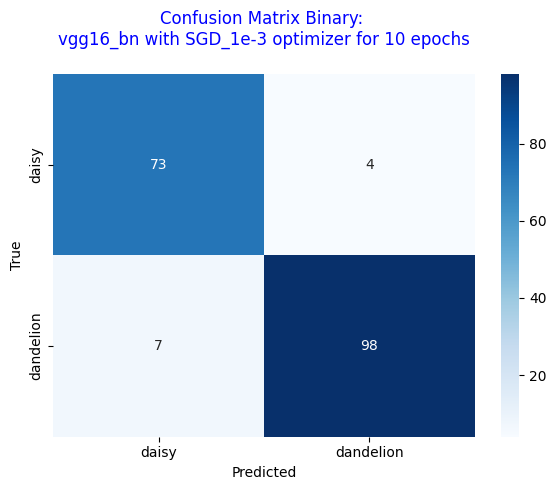

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



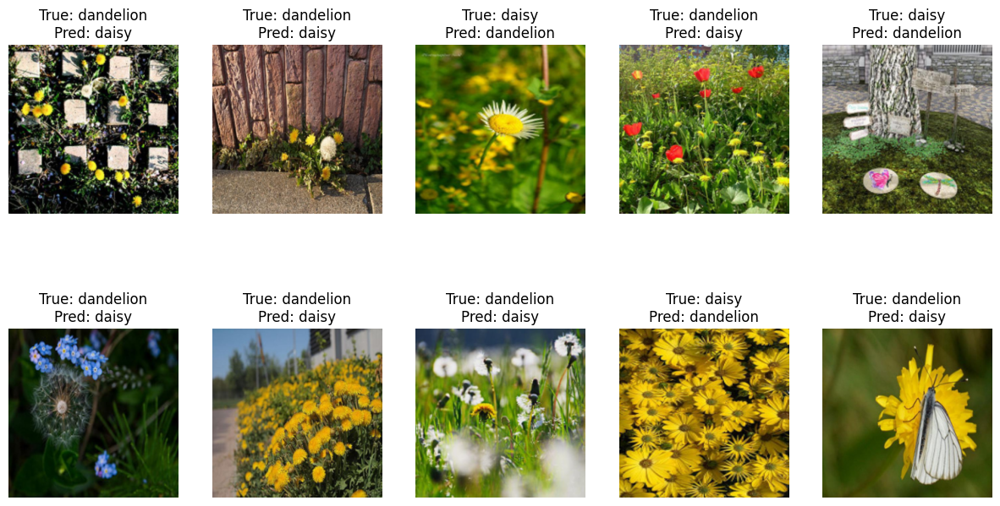

 
Training deep model vgg16_bn with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:   0%|          | 0/20 [00:58<?, ?it/s]

Epoch 1/20, F1 score:0.8847, Train Loss: 0.4402, Val Loss: 0.2589, Val Acc: 0.8819


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:   5%|▌         | 1/20 [02:09<22:26, 70.87s/it]

Epoch 2/20, F1 score:0.9412, Train Loss: 0.2069, Val Loss: 0.1425, Val Acc: 0.9368


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  10%|█         | 2/20 [03:18<21:02, 70.13s/it]

Epoch 3/20, F1 score:0.9604, Train Loss: 0.1431, Val Loss: 0.1123, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  20%|██        | 4/20 [04:23<17:05, 64.07s/it]

Epoch 4/20, F1 score:0.9323, Train Loss: 0.1227, Val Loss: 0.1562, Val Acc: 0.9286



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  20%|██        | 4/20 [05:21<17:05, 64.07s/it]

Epoch 5/20, F1 score:0.9600, Train Loss: 0.0985, Val Loss: 0.1000, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  25%|██▌       | 5/20 [06:26<16:03, 64.20s/it]

Epoch 6/20, F1 score:0.9574, Train Loss: 0.0809, Val Loss: 0.0952, Val Acc: 0.9533


Train_epoch in progress: 100%|██████████| 40/40 [00:53<00:00,  1.33s/it]

Training Progress:  30%|███       | 6/20 [07:37<15:28, 66.29s/it]

Epoch 7/20, F1 score:0.9598, Train Loss: 0.0679, Val Loss: 0.0910, Val Acc: 0.9560


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  40%|████      | 8/20 [08:42<12:43, 63.63s/it]

Epoch 8/20, F1 score:0.9570, Train Loss: 0.0721, Val Loss: 0.1045, Val Acc: 0.9533



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  40%|████      | 8/20 [09:40<12:43, 63.63s/it]

Epoch 9/20, F1 score:0.9650, Train Loss: 0.0696, Val Loss: 0.0876, Val Acc: 0.9615


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  50%|█████     | 10/20 [10:45<10:20, 62.08s/it]

Epoch 10/20, F1 score:0.9614, Train Loss: 0.0540, Val Loss: 0.1105, Val Acc: 0.9588



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  55%|█████▌    | 11/20 [11:43<09:07, 60.85s/it]

Epoch 11/20, F1 score:0.9673, Train Loss: 0.0430, Val Loss: 0.0938, Val Acc: 0.9643



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.30s/it]

Training Progress:  55%|█████▌    | 11/20 [12:41<09:07, 60.85s/it]

Epoch 12/20, F1 score:0.9698, Train Loss: 0.0414, Val Loss: 0.0860, Val Acc: 0.9670


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  60%|██████    | 12/20 [13:45<08:15, 61.88s/it]

Epoch 13/20, F1 score:0.9674, Train Loss: 0.0419, Val Loss: 0.0753, Val Acc: 0.9643


Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.32s/it]

Training Progress:  70%|███████   | 14/20 [14:51<06:09, 61.59s/it]

Epoch 14/20, F1 score:0.9646, Train Loss: 0.0426, Val Loss: 0.0833, Val Acc: 0.9615



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  75%|███████▌  | 15/20 [15:49<05:02, 60.44s/it]

Epoch 15/20, F1 score:0.9668, Train Loss: 0.0361, Val Loss: 0.1075, Val Acc: 0.9643



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  80%|████████  | 16/20 [16:47<03:58, 59.67s/it]

Epoch 16/20, F1 score:0.9698, Train Loss: 0.0275, Val Loss: 0.0805, Val Acc: 0.9670



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  85%|████████▌ | 17/20 [17:45<02:57, 59.13s/it]

Epoch 17/20, F1 score:0.9704, Train Loss: 0.0304, Val Loss: 0.0772, Val Acc: 0.9670



Train_epoch in progress: 100%|██████████| 40/40 [00:52<00:00,  1.31s/it]

Training Progress:  85%|████████▌ | 17/20 [18:43<03:18, 66.07s/it]


Epoch 18/20, F1 score:0.9724, Train Loss: 0.0190, Val Loss: 0.0767, Val Acc: 0.9698
Modello salvato in models/deep vgg16_bn
Early stopping
Log salvato in: models/deep vgg16_bn/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          18
best_epoch_early_stopping: 12
--------------------------------------------------
Final Training Loss: 0.0190
Final Validation Loss: 0.0767
Final Validation Accuracy: 0.9615
Final F1 score: 0.9665


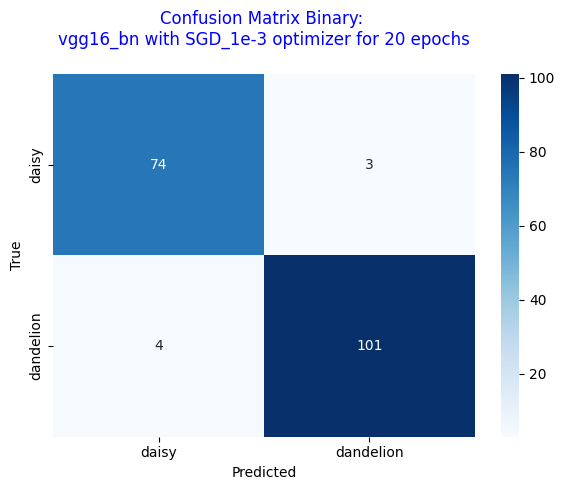

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



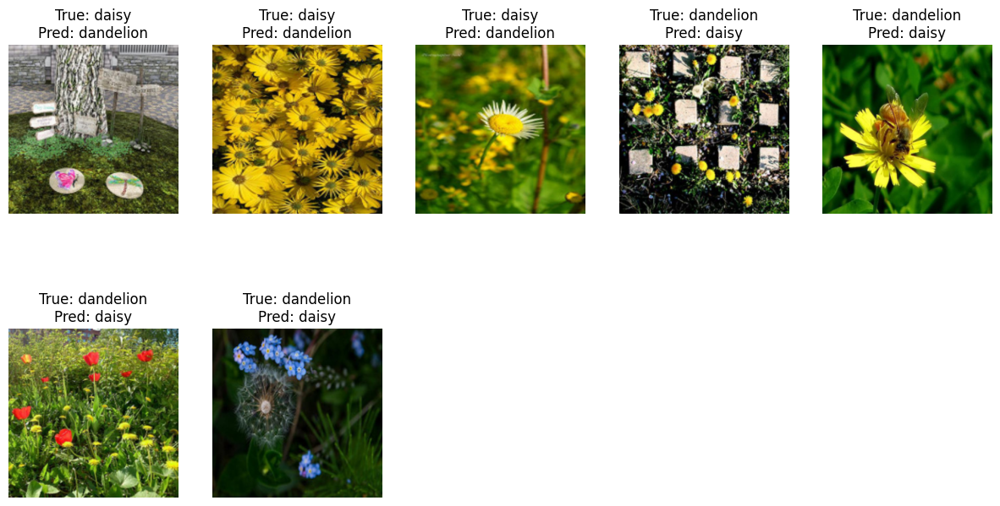

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


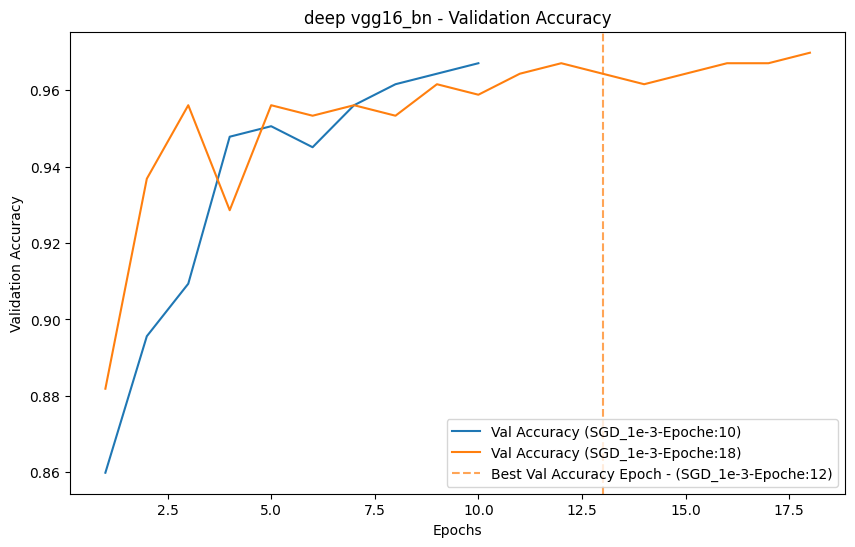

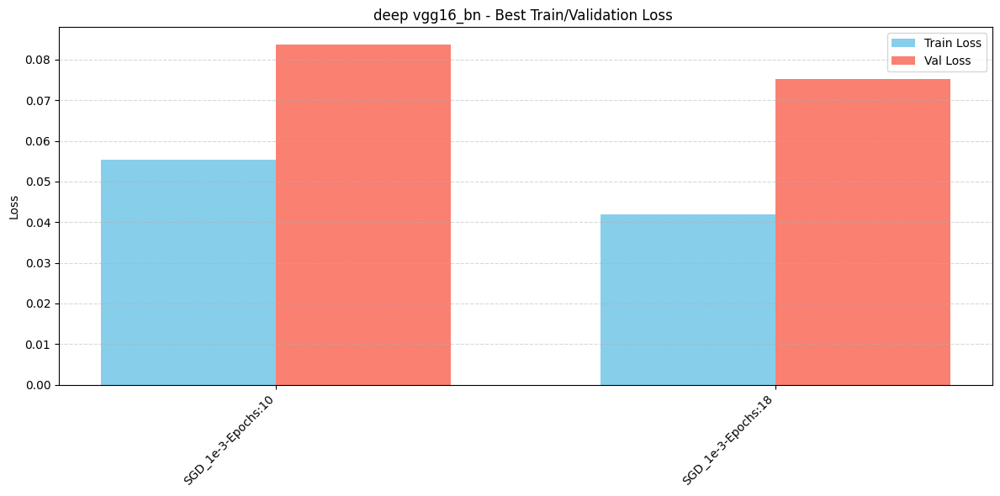

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


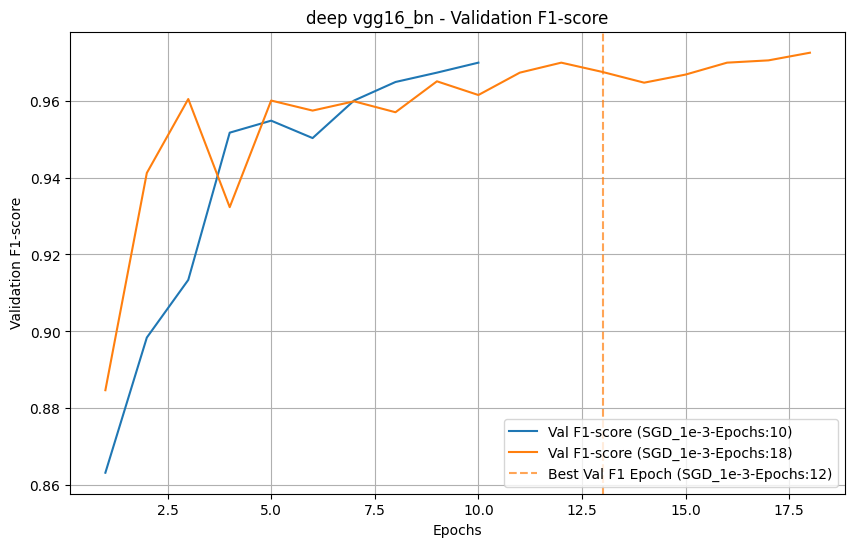

 
Training deep model resnet18 with SGD_1e-3 optimizer for 10 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:25<00:00,  1.55it/s]

Training Progress:  10%|█         | 1/10 [00:28<04:20, 28.96s/it]

Epoch 1/10, F1 score:0.7628, Train Loss: 0.6564, Val Loss: 0.6224, Val Acc: 0.6566



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.52it/s]

Training Progress:  20%|██        | 2/10 [00:58<03:55, 29.40s/it]

Epoch 2/10, F1 score:0.8485, Train Loss: 0.6072, Val Loss: 0.5712, Val Acc: 0.8077



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.53it/s]

Training Progress:  30%|███       | 3/10 [01:28<03:26, 29.45s/it]

Epoch 3/10, F1 score:0.8779, Train Loss: 0.5611, Val Loss: 0.5263, Val Acc: 0.8571



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Training Progress:  40%|████      | 4/10 [01:58<02:58, 29.69s/it]

Epoch 4/10, F1 score:0.8894, Train Loss: 0.5168, Val Loss: 0.4864, Val Acc: 0.8709



Train_epoch in progress: 100%|██████████| 40/40 [00:25<00:00,  1.54it/s]

Training Progress:  50%|█████     | 5/10 [02:27<02:28, 29.60s/it]

Epoch 5/10, F1 score:0.9078, Train Loss: 0.4826, Val Loss: 0.4427, Val Acc: 0.8956



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Training Progress:  60%|██████    | 6/10 [02:57<01:58, 29.71s/it]

Epoch 6/10, F1 score:0.9167, Train Loss: 0.4532, Val Loss: 0.4093, Val Acc: 0.9066



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  70%|███████   | 7/10 [03:27<01:29, 29.75s/it]

Epoch 7/10, F1 score:0.9123, Train Loss: 0.4312, Val Loss: 0.3868, Val Acc: 0.9038



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Training Progress:  80%|████████  | 8/10 [03:57<00:59, 29.78s/it]

Epoch 8/10, F1 score:0.9173, Train Loss: 0.3969, Val Loss: 0.3596, Val Acc: 0.9093



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  90%|█████████ | 9/10 [04:27<00:29, 29.76s/it]

Epoch 9/10, F1 score:0.9406, Train Loss: 0.3758, Val Loss: 0.3220, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress: 100%|██████████| 10/10 [04:57<00:00, 29.75s/it]


Epoch 10/10, F1 score:0.9173, Train Loss: 0.3566, Val Loss: 0.3085, Val Acc: 0.9093
Model salvato in deep resnet18/model.pt
Log salvato in: models/deep resnet18/log_experiment_1.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]


Experiment Summary: experiment_1
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.3566
Final Validation Loss: 0.3085
Final Validation Accuracy: 0.8791
Final F1 score: 0.8922


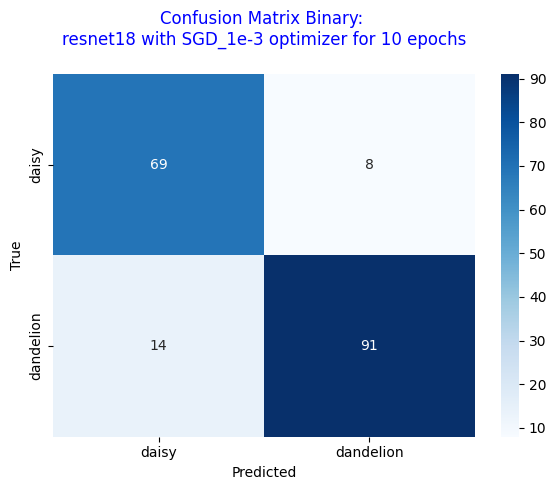

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



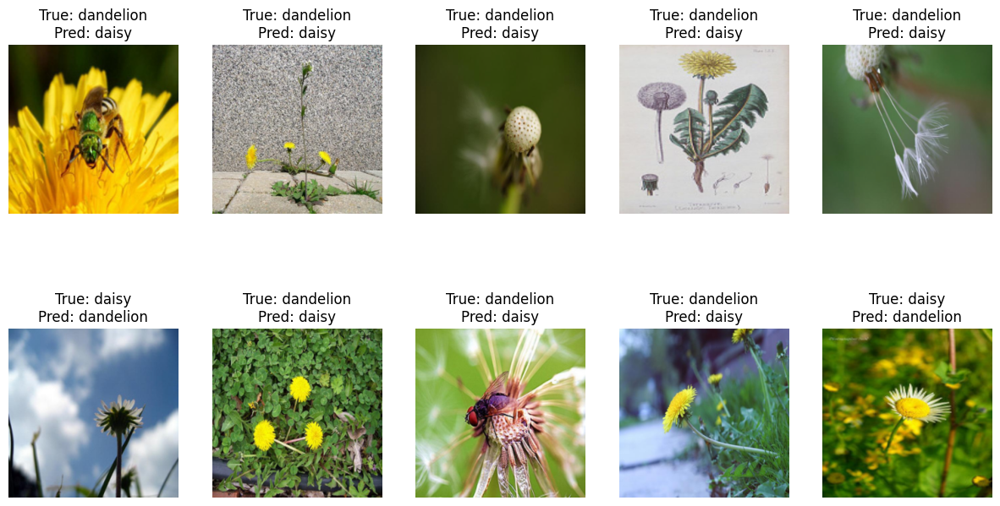

 
Training deep model resnet18 with SGD_1e-3 optimizer for 20 epochs


Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.52it/s]

Training Progress:   5%|▌         | 1/20 [00:29<09:19, 29.43s/it]

Epoch 1/20, F1 score:0.7299, Train Loss: 0.6763, Val Loss: 0.6412, Val Acc: 0.5934



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  10%|█         | 2/20 [00:59<08:53, 29.62s/it]

Epoch 2/20, F1 score:0.8457, Train Loss: 0.6200, Val Loss: 0.5845, Val Acc: 0.7995



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.53it/s]

Training Progress:  15%|█▌        | 3/20 [01:28<08:22, 29.54s/it]

Epoch 3/20, F1 score:0.8966, Train Loss: 0.5650, Val Loss: 0.5337, Val Acc: 0.8764



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  20%|██        | 4/20 [01:58<07:53, 29.62s/it]

Epoch 4/20, F1 score:0.9109, Train Loss: 0.5222, Val Loss: 0.4887, Val Acc: 0.9011



Train_epoch in progress: 100%|██████████| 40/40 [00:25<00:00,  1.54it/s]

Training Progress:  25%|██▌       | 5/20 [02:27<07:23, 29.55s/it]

Epoch 5/20, F1 score:0.9167, Train Loss: 0.4869, Val Loss: 0.4515, Val Acc: 0.9066



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  30%|███       | 6/20 [02:57<06:55, 29.67s/it]

Epoch 6/20, F1 score:0.9150, Train Loss: 0.4545, Val Loss: 0.4111, Val Acc: 0.9066



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  35%|███▌      | 7/20 [03:27<06:26, 29.73s/it]

Epoch 7/20, F1 score:0.9250, Train Loss: 0.4251, Val Loss: 0.3865, Val Acc: 0.9176



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Training Progress:  40%|████      | 8/20 [03:57<05:57, 29.76s/it]

Epoch 8/20, F1 score:0.9310, Train Loss: 0.4005, Val Loss: 0.3595, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.52it/s]

Training Progress:  45%|████▌     | 9/20 [04:26<05:26, 29.69s/it]

Epoch 9/20, F1 score:0.9223, Train Loss: 0.3790, Val Loss: 0.3319, Val Acc: 0.9148



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress:  50%|█████     | 10/20 [04:56<04:57, 29.78s/it]

Epoch 10/20, F1 score:0.9280, Train Loss: 0.3548, Val Loss: 0.3099, Val Acc: 0.9203



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  55%|█████▌    | 11/20 [05:26<04:28, 29.82s/it]

Epoch 11/20, F1 score:0.9300, Train Loss: 0.3390, Val Loss: 0.2932, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress:  60%|██████    | 12/20 [05:56<03:59, 29.93s/it]

Epoch 12/20, F1 score:0.9323, Train Loss: 0.3302, Val Loss: 0.2810, Val Acc: 0.9258



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.54it/s]

Training Progress:  65%|██████▌   | 13/20 [06:26<03:28, 29.77s/it]

Epoch 13/20, F1 score:0.9323, Train Loss: 0.3144, Val Loss: 0.2727, Val Acc: 0.9258



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Training Progress:  70%|███████   | 14/20 [06:56<02:58, 29.80s/it]

Epoch 14/20, F1 score:0.9296, Train Loss: 0.3012, Val Loss: 0.2544, Val Acc: 0.9231



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.53it/s]

Training Progress:  75%|███████▌  | 15/20 [07:25<02:28, 29.66s/it]

Epoch 15/20, F1 score:0.9350, Train Loss: 0.2995, Val Loss: 0.2421, Val Acc: 0.9286



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.49it/s]

Training Progress:  80%|████████  | 16/20 [07:55<01:59, 29.77s/it]

Epoch 16/20, F1 score:0.9400, Train Loss: 0.2759, Val Loss: 0.2397, Val Acc: 0.9341



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.53it/s]

Training Progress:  85%|████████▌ | 17/20 [08:24<01:28, 29.65s/it]

Epoch 17/20, F1 score:0.9350, Train Loss: 0.2679, Val Loss: 0.2309, Val Acc: 0.9286



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress:  90%|█████████ | 18/20 [08:54<00:59, 29.67s/it]

Epoch 18/20, F1 score:0.9505, Train Loss: 0.2601, Val Loss: 0.2091, Val Acc: 0.9451



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.52it/s]

Training Progress:  95%|█████████▌| 19/20 [09:24<00:29, 29.66s/it]

Epoch 19/20, F1 score:0.9450, Train Loss: 0.2564, Val Loss: 0.2108, Val Acc: 0.9396



Train_epoch in progress: 100%|██████████| 40/40 [00:26<00:00,  1.51it/s]

Training Progress: 100%|██████████| 20/20 [09:54<00:00, 29.71s/it]


Epoch 20/20, F1 score:0.9429, Train Loss: 0.2497, Val Loss: 0.2074, Val Acc: 0.9368
Model salvato in deep resnet18/model.pt
Log salvato in: models/deep resnet18/log_experiment_2.json


Test_epoch in progress: 100%|██████████| 6/6 [00:01<00:00,  3.86it/s]


Experiment Summary: experiment_2
--------------------------------------------------
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          20
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.2497
Final Validation Loss: 0.2074
Final Validation Accuracy: 0.9231
Final F1 score: 0.9333


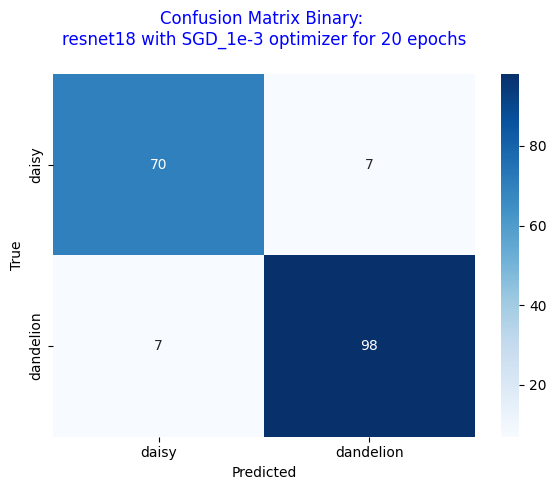

--------------------------------------------------
Visualizzazione degli errori commessi dal modello sul test set:
- Verranno mostrati esempi di immagini mal classificate,
  insieme alla loro classe predetta e alla classe reale.
- Questo aiuta a comprendere i casi in cui il modello fatica,
  evidenziando possibili pattern o ambiguità nei dati.
- Utile per analisi qualitative e miglioramento del modello.



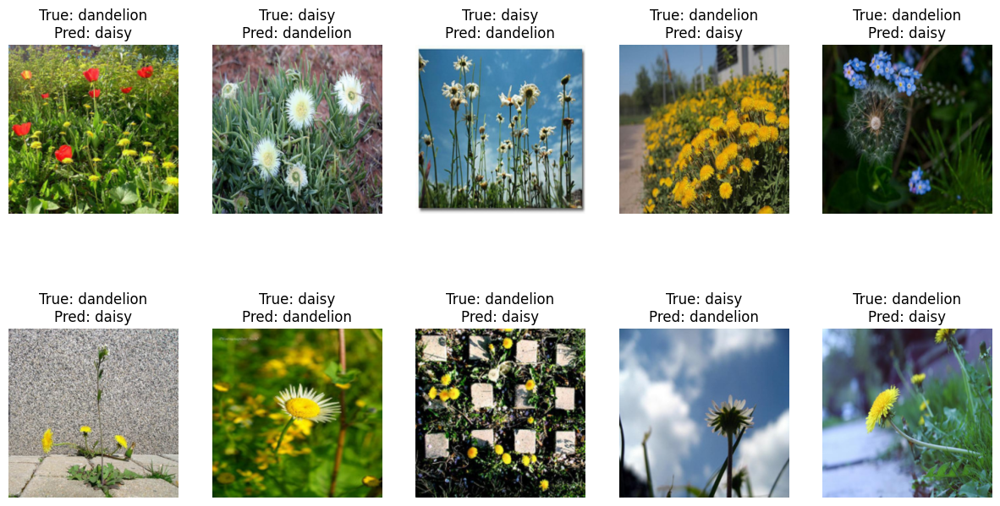

----------------------------------------------------------------------------------------------------


 Grafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni
Questi grafici mostrano l'andamento delle metriche di training e validazione,
come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore. 


----------------------------------------------------------------------------------------------------


/tmp/ipython-input-10-4269107424.py:158: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


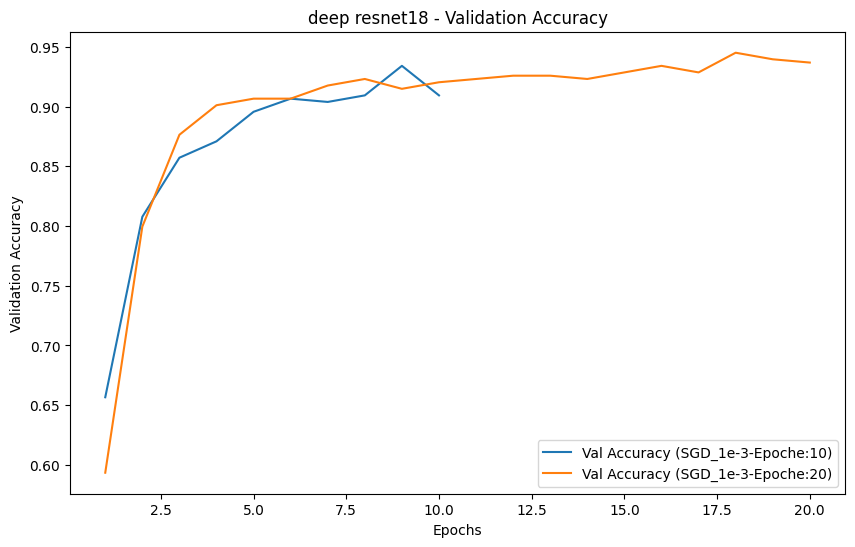

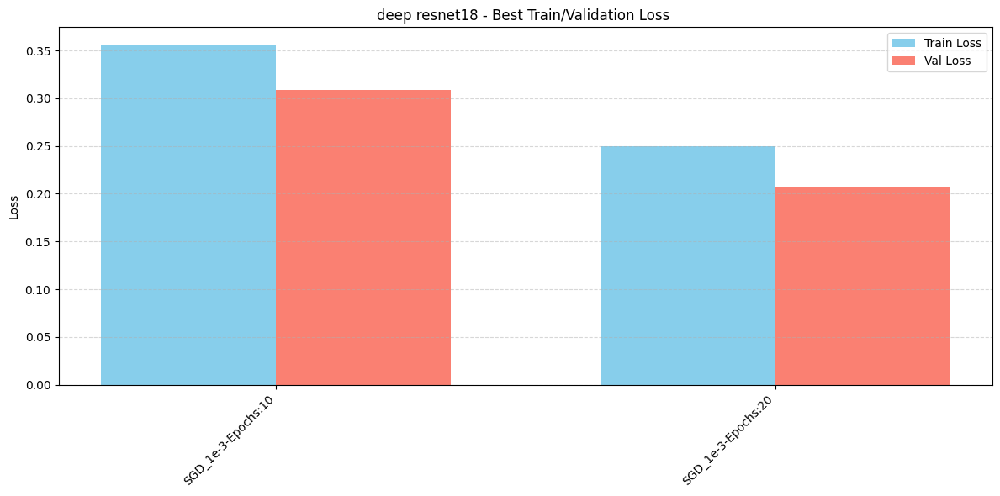

/tmp/ipython-input-10-4269107424.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


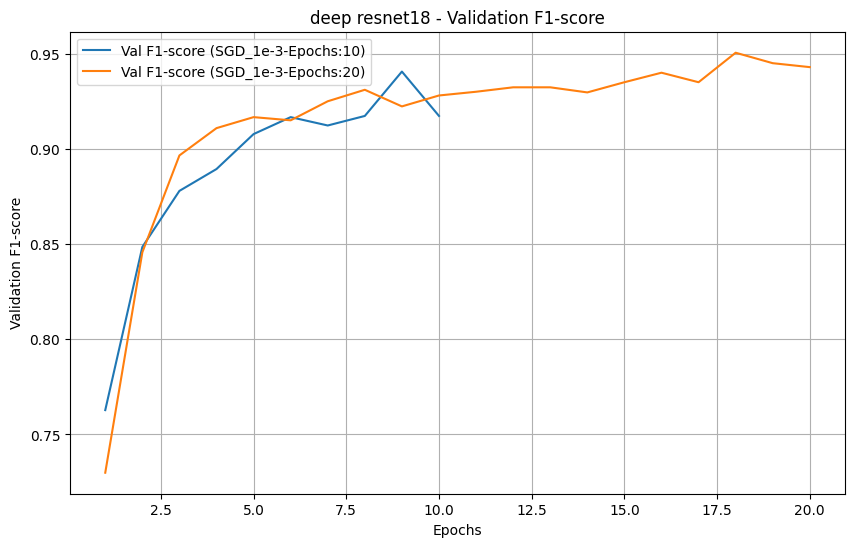

In [ ]:


# Comparatore dei modelli (plot loss e accuracy, f1 score)
comparer = ModelComparator("Experiments Comparison")
# definiamo il device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
early_stopping = EarlyStopping(patience=5, min_delta=0)


training_summaries = []
for aug,trainloader in enumerate(trainloaders):
  if aug == 0:
    mod_aug = 'light'
  elif aug == 1:
    mod_aug = 'medium'
  else:
    mod_aug = 'deep'
  for model_name,model_fn in models.items():
      training_logger = ExperimentLogger()
      for opt_name, opt_fn in optimizers.items():
          for epochs in epoch_list:
              experiment = f"\033[1;31m \nTraining {mod_aug} model {model_name} with {opt_name} optimizer for {epochs} epochs\033[0m"
              print(experiment)

              model = model_fn()


              trainer = Trainer(
                  model=model,
                  name=f"{mod_aug} {model_name}",
                  criterion=criterion,
                  device=device,
                  train_loader=trainloader,
                  val_loader=valloader,
                  classes=classes,
                  logger = training_logger
              )
              trainer.set_early_stopping(early_stopping)




              # Imposta optimizer
              optimizer = opt_fn(model)
              trainer.set_optimizer(optimizer,opt_name)

              # Add model to comparer
              key = comparer.add_model(f"{mod_aug} {model_name}", opt_name,epochs)
              # Train
              f1, train_losses, val_losses, val_accuracies,epochs_run, best_epoch = trainer.train(epochs=epochs)
              trainer.final_validation(testloader)



              # add results to comparer
              comparer.results_model(key, f1, train_losses, val_losses, val_accuracies, epochs_run, best_epoch)

              # Stampa info training
              info = trainer.get_last_training_info()
              training_summaries.append({
                      "experiment": experiment,
                      "summary": info
                  })
              àccuracy_plot = trainer.plot_confusion_matrix(test_loader= testloader)




              print("-"*50)
              print("Visualizzazione degli errori commessi dal modello sul test set:")
              print("- Verranno mostrati esempi di immagini mal classificate,")
              print("  insieme alla loro classe predetta e alla classe reale.")
              print("- Questo aiuta a comprendere i casi in cui il modello fatica,")
              print("  evidenziando possibili pattern o ambiguità nei dati.")
              print("- Utile per analisi qualitative e miglioramento del modello.\n")
              # Mostra errori (10 immagini sbagliate)
              trainer.show_errors(test_loader= testloader)




      print("-" * 100)

      print("\n\n \033[1mGrafici di performance relativi ai singoli modelli sui vari ottimizzatori/regolarizzazioni\033[0m")
      print("\033[91mQuesti grafici mostrano l'andamento delle metriche di training e validazione,\n"
        "come la loss e l'accuratezza, per ogni combinazione di modello e ottimizzatore.\033[0m \n\n")
      print("-" * 100)

      trainer.plot_accuracies()
      trainer.plot_losses_bar()
      trainer.plot_f1_scores()




**ANALISI RISULTATI**


    | Modello             | Ottimizz.   | Epoche | Val Acc | Val Loss | Train Loss | F1 Score
    | vgg16_bn (light)    | SGD_1e-3    | 10     | 0.9615  | 0.0851   | 0.0144     | 0.9665
    | vgg16_bn (medium)   | SGD_1e-3    | 20     | 0.9615  | 0.0847   | 0.0111     | 0.9668
    | vgg16_bn (deep)     | SGD_1e-3    | 20     | 0.9615  | 0.0774   | 0.0203     | 0.9665
    | vgg16_bn (light)    | SGD_1e-3    | 20     | 0.9560  | 0.0856   | 0.0134     | 0.9615
    | vgg16_bn (medium)   | SGD_1e-3    | 10     | 0.9560  | 0.1027   | 0.0469     | 0.9619
    | vgg16_bn (light)    | SGD_1e-3    | 50     | 0.9560  | 0.0997   | 0.0117     | 0.9619
    | resnet18 (light)    | Adam_1e-3   | 10     | 0.9451  | 0.1708   | 0.0507     | 0.9519
    | vgg16_bn (light)    | Adam_1e-3   | 10     | 0.8956  | 0.2190   | 0.1950     | 0.9148
    | vgg16_bn (light)    | Adam_1e-3   | 50     | 0.8736  | 0.3247   | 0.4686     | 0.8969
    | resnet18 (light)    | SGD_1e-3    | 20     | 0.9286  | 0.2175   | 0.2198     | 0.9384
    | resnet18 (deep)     | SGD_1e-3    | 20     | 0.9286  | 0.2014   | 0.2480     | 0.9384
    | resnet18 (light)    | SGD_1e-3    | 10     | 0.9231  | 0.2929   | 0.3144     | 0.9352
    | resnet18 (medium)   | SGD_1e-3    | 20     | 0.9176  | 0.2133   | 0.2610     | 0.9275
    | resnet18 (medium)   | SGD_1e-3    | 10     | 0.8846  | 0.3152   | 0.3491     | 0.9023
    | resnet18 (deep)     | SGD_1e-3    | 10     | 0.8791  | 0.3209   | 0.3613     | 0.8922
    | vgg16_bn (light)    | Adam_1e-3   | 20     | 0.8462  | 0.6328   | 0.2652     | 0.8667


Dall’analisi dei risultati emerge che il modello VGG16_bn con ottimizzatore SGD offre le migliori performance, con accuratezza superiore al 96% e validation loss contenuti. Questa combinazione si è dimostrata stabile e efficace anche con diverse profondità e durate di training.

Il modello ResNet18, pur performando bene con Adam, mostra risultati più variabili e validation loss generalmente più alti, soprattutto con SGD. Pertanto, VGG16_bn con SGD risulta la scelta più affidabile e performante per questo task.


**LOGGING**

La classe Trainer organizza e salva i dati di training, come loss, accuracy e F1score per ogni epoca, mantenendoli in una lista di esperimenti. Ogni esperimento può essere esportato in un file JSON per una registrazione persistente. Inoltre, il modello viene salvato automaticamente in una cartella dedicata con struttura ordinata, facilitando il caricamento e la gestione. Questa gestione integrata supporta il confronto tra modelli, ottimizzatori e configurazioni diverse, garantendo tracciabilità e riproducibilità degli esperimenti.








**ANALISI ERRORI**

Nonostante le buone performance complessive con accuracy intorno al 96%, il modello mostra alcune difficoltà nel distinguere correttamente le due classi, dandelion e daisy. Gli errori più frequenti sembrano legati a caratteristiche visive molto simili o ambigue.

Ad esempio, lo stelo, tipicamente associato al dandelion, viene spesso usato dal modello come criterio discriminante: inquadrature di daisy viste dal basso, con lo stelo in evidenza, vengono erroneamente classificate come dandelion. Questo indica che il modello potrebbe attribuire troppo peso a dettagli contestuali come lo stelo, anziché concentrarsi su caratteristiche più salienti del fiore.

Un altro errore comune riguarda la forma dei petali. Quando la forma è geometrica e a raggiera, il modello tende a etichettare la foto come daisy, anche se non lo è, suggerendo una certa rigidità nell’interpretazione della morfologia del fiore. Allo stesso modo, immagini di daisy viste dall’alto con petali gialli vengono scambiate per dandelion, probabilmente perché il modello confonde il colore giallo del centro della margherita con il colore tipico del dandelion, enfatizzando il colore a discapito della forma complessiva.

Inoltre, fiori di profilo o margherite che non presentano petali bianchi ben definiti e struttura a raggiera chiara sono più soggetti a errori, classificati erroneamente come dandelion. Questo suggerisce che il modello fatica quando le caratteristiche classiche delle classi sono meno evidenti o presentano variazioni, come petali colorati diversamente o forme meno regolari.

Questi errori sottolineano come il modello, basandosi solo su informazioni visive, può essere influenzato da dettagli non discriminanti o da variazioni naturali delle classi. Per migliorare la discriminazione, potrebbe essere utile integrare ulteriori dati contestuali, come angolazioni standardizzate o metadati, e arricchire il dataset con esempi più vari per insegnare al modello a riconoscere meglio le differenze sottili tra fiori simili.

**CONCLUSIONE**

In questo esperimento di classificazione binaria di immagini di fiori, con un dataset ridotto a circa 600 immagini, i risultati mostrano come la combinazione VGG16 con ottimizzatore SGD sia quella che ha garantito le performance migliori, raggiungendo un’accuratezza di validazione intorno al 96%. Questo suggerisce che SGD, probabilmente grazie a una convergenza più stabile e meno aggressiva, non attivi mai l’early stopping, permettendo un addestramento più completo senza sovrallenamento. Al contrario, Adam si è mostrato più instabile, specie con VGG16, dove le performance sono risultate peggiori, probabilmente a causa della sua natura adattiva che può causare oscillazioni nei gradienti con dataset piccoli e modelli meno profondi.

ResNet, con Adam, invece, si è comportato molto meglio rispetto a VGG16-Adam, probabilmente per la sua architettura residuale che facilita l’addestramento e migliora la stabilità dell’ottimizzazione. Le loss risultano generalmente più basse con una data augmentation più profonda, confermando l’importanza di aumentare la varietà del training set per migliorare la generalizzazione.

L’ideale sembra essere un numero di epoche compreso tra 20 e 30, bilanciando bene apprendimento e rischio di overfitting. Infine, gli F1-score elevati (vicini o superiori a 0.95) indicano che i modelli sono efficaci non solo nell’accuratezza globale ma anche nell’equilibrio tra precisione e recall, aspetto fondamentale in un task binario dove entrambi gli errori (falsi positivi e falsi negativi) possono avere impatti significativi.

In [ ]:


print("\n\n\033[1mRiepilogo Esperimenti:\033[0m")
for summary in training_summaries:
    print(summary["experiment"])
    print("="*50)
    print(f"Optimizer:           {summary['summary'].get('optimizer', 'N/A')}")
    print(f"Criterion:           {summary['summary'].get('criterion', 'N/A')}")
    print(f"Epochs Run:          {summary['summary'].get('epochs_run', 'N/A')}")
    print(f"best_epoch_early_stopping: {summary['summary'].get('best_epoch_early_stopping', 'N/A')}")
    print("-"*50)
    print(f"Final Training Loss: {summary['summary']['train_losses'][-1]:.4f}")
    print(f"Final Validation Loss: {summary['summary']['val_losses'][-1]:.4f}")
    print(f"Final Validation Accuracy: {summary['summary']['final_accuracy']:.4f}")
    print(f"Final f1 Score : {summary['summary']['final_f1']:.4f}")
    print("="*50)






Riepilogo Esperimenti:
 
Training light model vgg16_bn with SGD_1e-3 optimizer for 10 epochs
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Training Loss: 0.0144
Final Validation Loss: 0.0854
Final Validation Accuracy: 0.9615
Final f1 Score : 0.9665
 
Training light model vgg16_bn with SGD_1e-3 optimizer for 20 epochs
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          14
best_epoch_early_stopping: 8
--------------------------------------------------
Final Training Loss: 0.0111
Final Validation Loss: 0.0862
Final Validation Accuracy: 0.9560
Final f1 Score : 0.9615
 
Training light model resnet18 with SGD_1e-3 optimizer for 10 epochs
Optimizer:           SGD_1e-3
Criterion:           BCEWithLogitsLoss
Epochs Run:          10
best_epoch_early_stopping: None
--------------------------------------------------
Final Tr

**ANALISI PERFORMANCE DATA AUGMENTATION**


L’analisi mostra che l’aumento della data augmentation da light a medium e deep migliora generalmente le prestazioni dei modelli, aiutandoli a generalizzare meglio su un dataset relativamente piccolo di circa 600 immagini. I modelli con augmentation light tendono a sovra-adattarsi più facilmente, soprattutto con Adam, che si mostra meno stabile in questi casi.

Con augmentation medium, i modelli, in particolare VGG16 con SGD, raggiungono le migliori performance, con accuratezze intorno al 96% e ottimi valori di F1-score, segno di un buon equilibrio tra precisione e recall. L’augmentation deep aiuta ulteriormente a ridurre le loss e stabilizzare l’allenamento, ma i miglioramenti rispetto al livello medium sono meno evidenti.

In generale, SGD si comporta in modo più stabile, senza mai attivare early stopping, probabilmente perché l’ottimizzazione è più graduale e regolare. Adam, pur convergendo più velocemente, mostra instabilità e prestazioni peggiori su VGG16, mentre con ResNet ottiene risultati migliori grazie alla struttura residua più robusta.

Questi risultati indicano che un’adeguata augmentation e la scelta di ottimizzatore sono cruciali per sfruttare al meglio modelli diversi, soprattutto in contesti con dati limitati.

/tmp/ipython-input-11-107134303.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


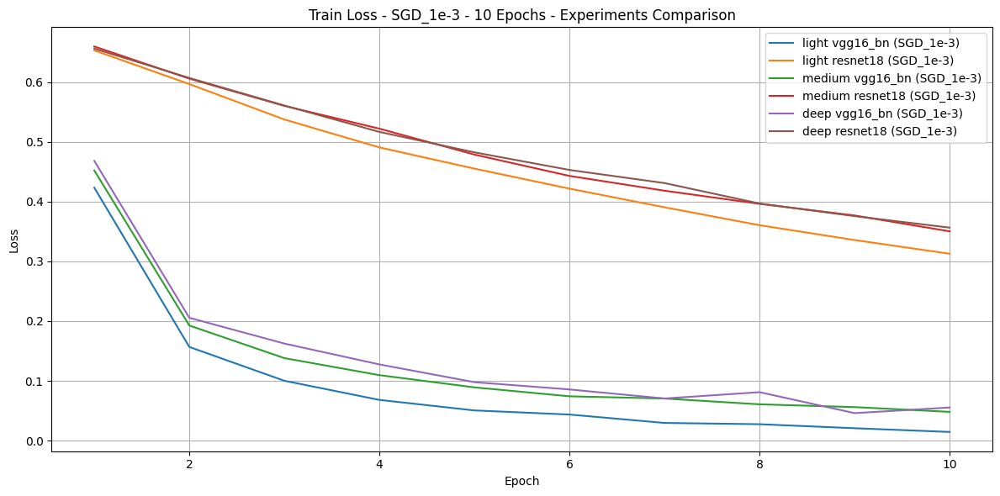

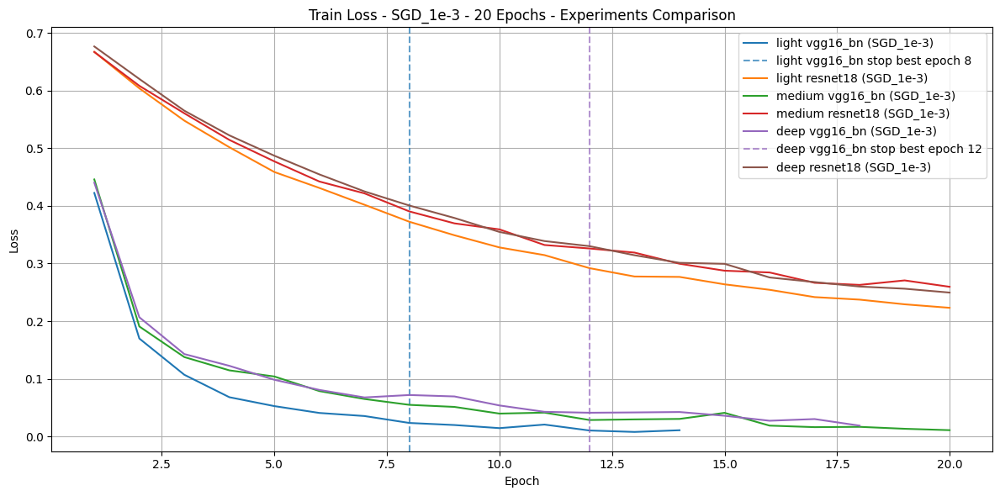

/tmp/ipython-input-11-107134303.py:77: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


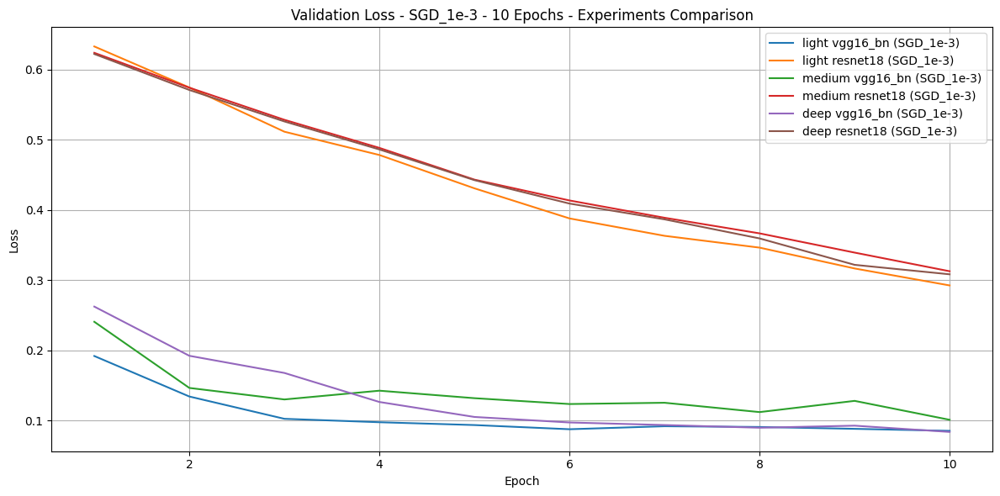

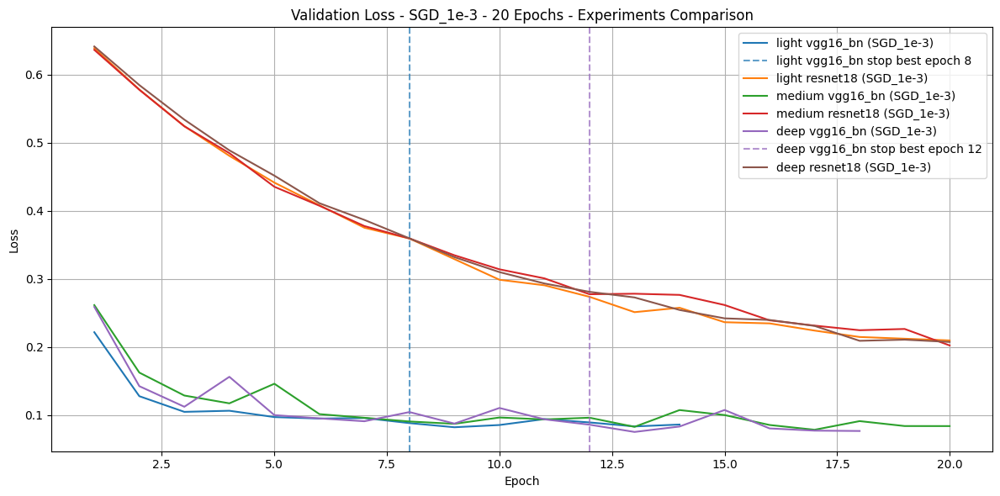

/tmp/ipython-input-11-107134303.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


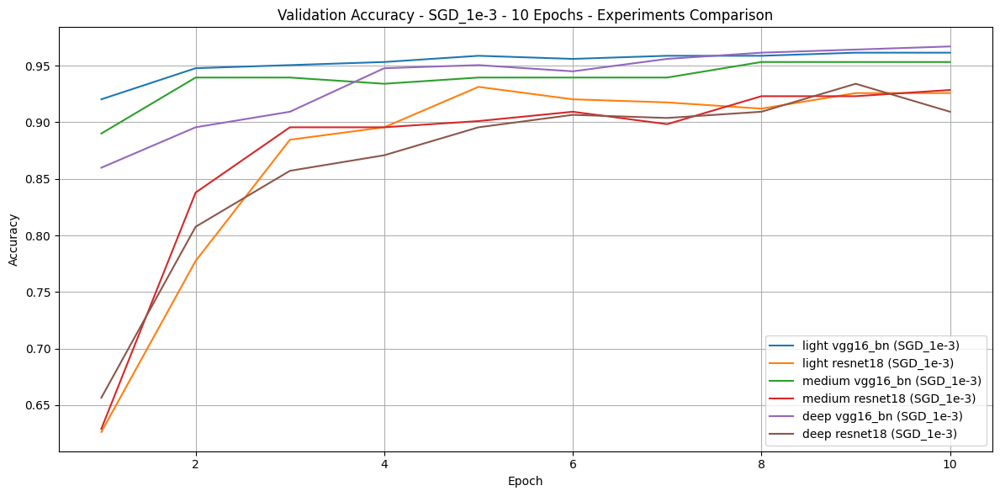

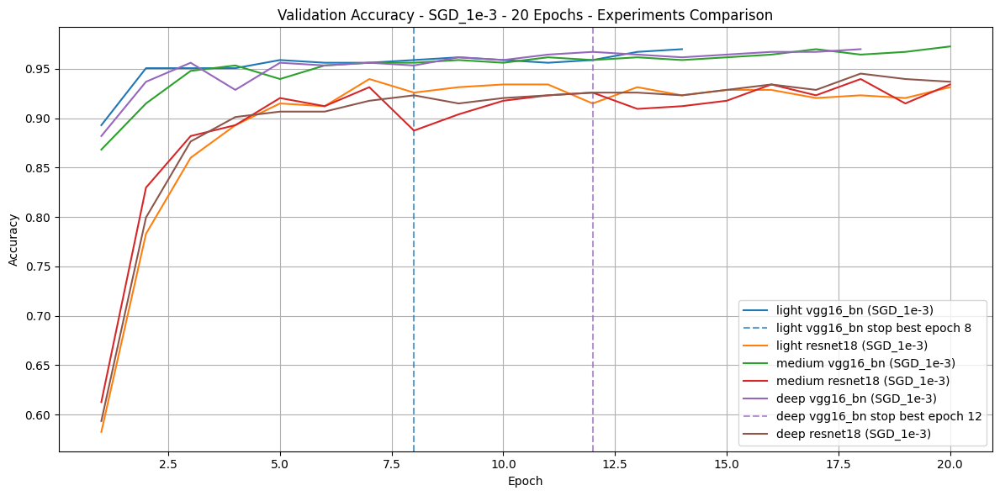

/tmp/ipython-input-11-107134303.py:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10')


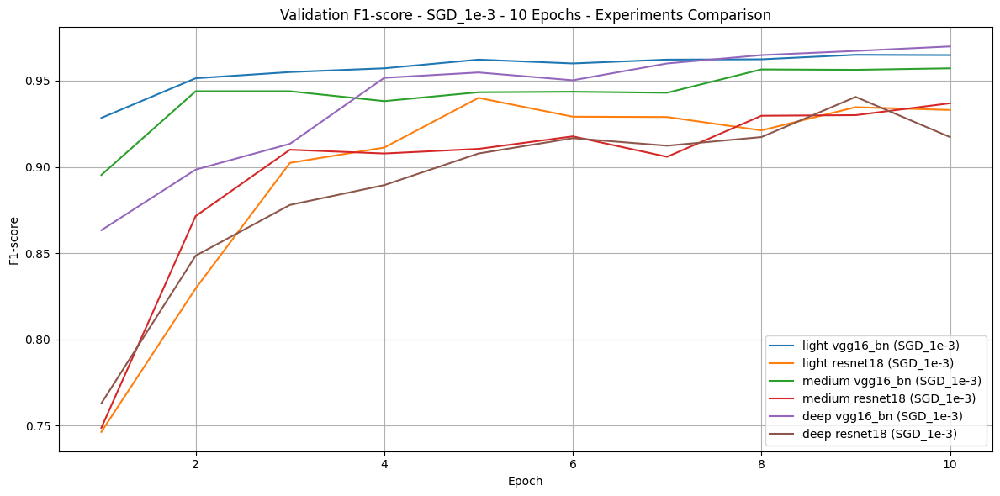

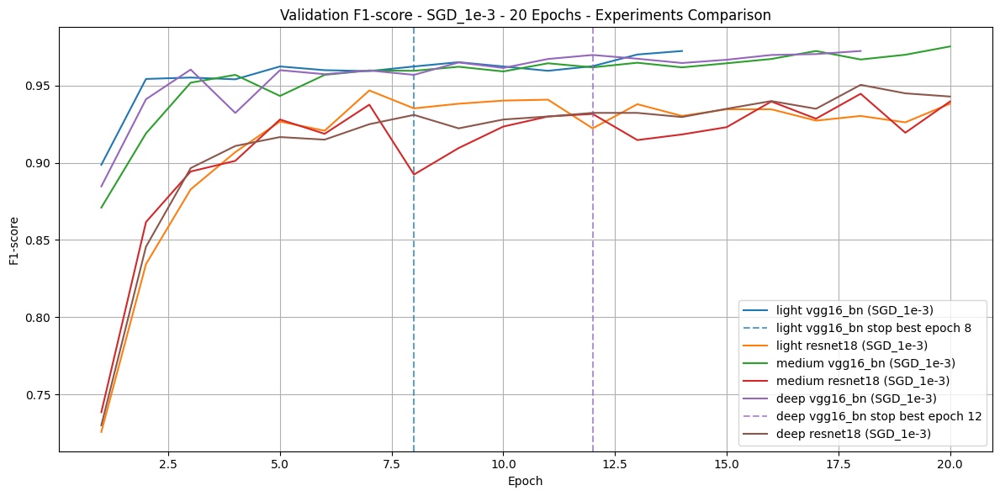

In [ ]:



comparer.plot_loss_train()
comparer.plot_loss_validate()
comparer.plot_accuracy()
comparer.plot_f1_scores()